# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 4ey8lh1c
Name: lunar-wave-613
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/4ey8lh1c
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_085939-4ey8lh1c/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 200,396,443,189,388,306,561,147,466,361,434,360,230,283,54,216,443,279,279,523,237,274,150,53,330,154,113,286,102,75,185,191,49,328,227,177,269,146,95,194,375,472,332,968,138,392,174,202,280,319,216,141,383,271,258,369,317,627,305,291,230,579,242,147,264,338,278,740,331,361,267,366,381,364,122,216,231,152,57,125,198,503,313,271,329,215,147,247,378,173,143,103,256,399,159,159,448,74,144,297,168,368,106,236,180,216,326,131,151,300,272,117,104,345,345,365,272,41,47,217,218,264,83,205,319,245,194,234,291,224,966,266,200,526,305,156,497,332,517,457,209,464,465,270,357,238,349,240,283,295,272,240,262,409,390,241,244,196,160,619,239,241,144,151,161,167,545,239,384,218,266,408,607,397,299,256,231,235,173,174,213,186,216,238,610,353,327,340,373,7118,437,279,193,171,354,175,264,271,166,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 76,85,115,43,107,73,126,28,116,102,99,104,71,75,5,48,119,86,69,140,69,61,38,11,80,30,21,78,24,32,45,54,15,84,59,34,62,34,19,43,93,94,83,251,41,83,41,39,75,79,69,37,87,57,71,109,70,160,77,75,60,152,55,36,58,87,76,165,110,84,57,93,70,81,37,68,46,39,14,26,49,127,69,74,97,57,45,48,101,43,32,27,73,95,33,41,104,22,49,71,47,95,20,67,57,58,84,36,32,68,77,23,37,100,82,79,55,13,12,49,60,65,13,49,76,66,43,64,70,39,231,71,41,121,70,36,126,100,109,124,52,107,114,68,94,62,95,62,80,71,67,62,57,91,107,72,54,41,32,151,71,52,32,35,54,35,122,76,96,51,79,104,143,116,73,66,53,56,45,48,51,50,39,67,153,81,85,106,90,1789,93,70,52,40,92,42,67,61,34,80,32,65,66,74,66,124,65,55,97,20,12,40,61,80,18,59,75,75,36,42,69,75,74,65,55,44,60,67,54,80,67,94,60,69,11,57,41,123,126,129,94,70,63,65,198,115,19,62,6

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:46:24, 20.81s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:46:24, 20.81s/it, v_num=1c_1, total_loss_train=1.45e+3, kl_local_train=95.8]

Epoch 2/1000:   0%|          | 1/1000 [00:21<5:46:24, 20.81s/it, v_num=1c_1, total_loss_train=1.45e+3, kl_local_train=95.8]

Epoch 2/1000:   0%|          | 2/1000 [00:27<3:30:38, 12.66s/it, v_num=1c_1, total_loss_train=1.45e+3, kl_local_train=95.8]

Epoch 2/1000:   0%|          | 2/1000 [00:27<3:30:38, 12.66s/it, v_num=1c_1, total_loss_train=1.31e+3, kl_local_train=42.6]

Epoch 3/1000:   0%|          | 2/1000 [00:27<3:30:38, 12.66s/it, v_num=1c_1, total_loss_train=1.31e+3, kl_local_train=42.6]

Epoch 3/1000:   0%|          | 3/1000 [00:34<2:45:12,  9.94s/it, v_num=1c_1, total_loss_train=1.31e+3, kl_local_train=42.6]

Epoch 3/1000:   0%|          | 3/1000 [00:34<2:45:12,  9.94s/it, v_num=1c_1, total_loss_train=1.3e+3, kl_local_train=3.38] 

Epoch 4/1000:   0%|          | 3/1000 [00:34<2:45:12,  9.94s/it, v_num=1c_1, total_loss_train=1.3e+3, kl_local_train=3.38]

Epoch 4/1000:   0%|          | 4/1000 [00:41<2:23:45,  8.66s/it, v_num=1c_1, total_loss_train=1.3e+3, kl_local_train=3.38]

Epoch 4/1000:   0%|          | 4/1000 [00:41<2:23:45,  8.66s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=1.28]

Epoch 5/1000:   0%|          | 4/1000 [00:41<2:23:45,  8.66s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=1.28]

Epoch 5/1000:   0%|          | 5/1000 [00:47<2:11:41,  7.94s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=1.28]

Epoch 5/1000:   0%|          | 5/1000 [00:47<2:11:41,  7.94s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=6.33]

Epoch 6/1000:   0%|          | 5/1000 [00:47<2:11:41,  7.94s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=6.33]

Epoch 6/1000:   1%|          | 6/1000 [00:54<2:04:27,  7.51s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=6.33]

Epoch 6/1000:   1%|          | 6/1000 [00:54<2:04:27,  7.51s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 6/1000 [00:54<2:04:27,  7.51s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 7/1000 [01:01<1:59:45,  7.24s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=27.9]

Epoch 7/1000:   1%|          | 7/1000 [01:01<1:59:45,  7.24s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 8/1000:   1%|          | 7/1000 [01:01<1:59:45,  7.24s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 8/1000:   1%|          | 8/1000 [01:07<1:56:34,  7.05s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=25.2]

Epoch 8/1000:   1%|          | 8/1000 [01:07<1:56:34,  7.05s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=27.5]

Epoch 9/1000:   1%|          | 8/1000 [01:07<1:56:34,  7.05s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=27.5]

Epoch 9/1000:   1%|          | 9/1000 [01:14<1:54:27,  6.93s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=27.5]

Epoch 9/1000:   1%|          | 9/1000 [01:14<1:54:27,  6.93s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=32.4]

Epoch 10/1000:   1%|          | 9/1000 [01:14<1:54:27,  6.93s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=32.4]

Epoch 10/1000:   1%|          | 10/1000 [01:21<1:53:24,  6.87s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=32.4]

Epoch 10/1000:   1%|          | 10/1000 [01:21<1:53:24,  6.87s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=32.7]

Epoch 11/1000:   1%|          | 10/1000 [01:21<1:53:24,  6.87s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=32.7]

Epoch 11/1000:   1%|          | 11/1000 [01:27<1:52:14,  6.81s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=32.7]

Epoch 11/1000:   1%|          | 11/1000 [01:27<1:52:14,  6.81s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=31.3] 

Epoch 12/1000:   1%|          | 11/1000 [01:27<1:52:14,  6.81s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=31.3]

Epoch 12/1000:   1%|          | 12/1000 [01:34<1:51:22,  6.76s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=31.3]

Epoch 12/1000:   1%|          | 12/1000 [01:34<1:51:22,  6.76s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=32]  

Epoch 13/1000:   1%|          | 12/1000 [01:34<1:51:22,  6.76s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=32]

Epoch 13/1000:   1%|▏         | 13/1000 [01:41<1:50:49,  6.74s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=32]

Epoch 13/1000:   1%|▏         | 13/1000 [01:41<1:50:49,  6.74s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=33.2]

Epoch 14/1000:   1%|▏         | 13/1000 [01:41<1:50:49,  6.74s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=33.2]

Epoch 14/1000:   1%|▏         | 14/1000 [01:47<1:50:20,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=33.2]

Epoch 14/1000:   1%|▏         | 14/1000 [01:47<1:50:20,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=35.9]

Epoch 15/1000:   1%|▏         | 14/1000 [01:47<1:50:20,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=35.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:54<1:50:08,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=35.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:54<1:50:08,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=43.3]

Epoch 16/1000:   2%|▏         | 15/1000 [01:54<1:50:08,  6.71s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=43.3]

Epoch 16/1000:   2%|▏         | 16/1000 [02:01<1:49:46,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=43.3]

Epoch 16/1000:   2%|▏         | 16/1000 [02:01<1:49:46,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=48.6]

Epoch 17/1000:   2%|▏         | 16/1000 [02:01<1:49:46,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=48.6]

Epoch 17/1000:   2%|▏         | 17/1000 [02:07<1:49:35,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=48.6]

Epoch 17/1000:   2%|▏         | 17/1000 [02:07<1:49:35,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=51.2]

Epoch 18/1000:   2%|▏         | 17/1000 [02:07<1:49:35,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=51.2]

Epoch 18/1000:   2%|▏         | 18/1000 [02:14<1:49:24,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=51.2]

Epoch 18/1000:   2%|▏         | 18/1000 [02:14<1:49:24,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=57.3]

Epoch 19/1000:   2%|▏         | 18/1000 [02:14<1:49:24,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=57.3]

Epoch 19/1000:   2%|▏         | 19/1000 [02:21<1:49:18,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=57.3]

Epoch 19/1000:   2%|▏         | 19/1000 [02:21<1:49:18,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=62.3]

Epoch 20/1000:   2%|▏         | 19/1000 [02:21<1:49:18,  6.69s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=62.3]

Epoch 20/1000:   2%|▏         | 20/1000 [02:27<1:49:04,  6.68s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=62.3]

Epoch 20/1000:   2%|▏         | 20/1000 [02:27<1:49:04,  6.68s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 20/1000 [02:27<1:49:04,  6.68s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 21/1000 [02:34<1:48:51,  6.67s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=64.4]

Epoch 21/1000:   2%|▏         | 21/1000 [02:34<1:48:51,  6.67s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 22/1000:   2%|▏         | 21/1000 [02:34<1:48:51,  6.67s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 22/1000:   2%|▏         | 22/1000 [02:41<1:48:04,  6.63s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=66.4]

Epoch 22/1000:   2%|▏         | 22/1000 [02:41<1:48:04,  6.63s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=68.4]

Epoch 23/1000:   2%|▏         | 22/1000 [02:41<1:48:04,  6.63s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=68.4]

Epoch 23/1000:   2%|▏         | 23/1000 [02:47<1:48:01,  6.63s/it, v_num=1c_1, total_loss_train=1.19e+3, kl_local_train=68.4]

Epoch 23/1000:   2%|▏         | 23/1000 [02:47<1:48:01,  6.63s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=70.2] 

Epoch 24/1000:   2%|▏         | 23/1000 [02:47<1:48:01,  6.63s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=70.2]

Epoch 24/1000:   2%|▏         | 24/1000 [02:54<1:48:00,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=70.2]

Epoch 24/1000:   2%|▏         | 24/1000 [02:54<1:48:00,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 25/1000:   2%|▏         | 24/1000 [02:54<1:48:00,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:01<1:47:58,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:01<1:47:58,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 26/1000:   2%|▎         | 25/1000 [03:01<1:47:58,  6.64s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 26/1000:   3%|▎         | 26/1000 [03:07<1:47:53,  6.65s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=72.9]

Epoch 26/1000:   3%|▎         | 26/1000 [03:07<1:47:53,  6.65s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 27/1000:   3%|▎         | 26/1000 [03:07<1:47:53,  6.65s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 27/1000:   3%|▎         | 27/1000 [03:14<1:47:55,  6.65s/it, v_num=1c_1, total_loss_train=1.2e+3, kl_local_train=80.4]

Epoch 27/1000:   3%|▎         | 27/1000 [03:14<1:47:55,  6.65s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=78.5]

Epoch 28/1000:   3%|▎         | 27/1000 [03:14<1:47:55,  6.65s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=78.5]

Epoch 28/1000:   3%|▎         | 28/1000 [03:21<1:47:50,  6.66s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=78.5]

Epoch 28/1000:   3%|▎         | 28/1000 [03:21<1:47:50,  6.66s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=79.3]

Epoch 29/1000:   3%|▎         | 28/1000 [03:21<1:47:50,  6.66s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=79.3]

Epoch 29/1000:   3%|▎         | 29/1000 [03:27<1:47:56,  6.67s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=79.3]

Epoch 29/1000:   3%|▎         | 29/1000 [03:27<1:47:56,  6.67s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=80.9]

Epoch 30/1000:   3%|▎         | 29/1000 [03:27<1:47:56,  6.67s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=80.9]

Epoch 30/1000:   3%|▎         | 30/1000 [03:34<1:48:03,  6.68s/it, v_num=1c_1, total_loss_train=1.21e+3, kl_local_train=80.9]

Epoch 30/1000:   3%|▎         | 30/1000 [03:34<1:48:03,  6.68s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 31/1000:   3%|▎         | 30/1000 [03:34<1:48:03,  6.68s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 31/1000:   3%|▎         | 31/1000 [03:41<1:47:59,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=83.4]

Epoch 31/1000:   3%|▎         | 31/1000 [03:41<1:47:59,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 31/1000 [03:41<1:47:59,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 32/1000 [03:47<1:47:56,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 32/1000:   3%|▎         | 32/1000 [03:47<1:47:56,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=84.2]

Epoch 33/1000:   3%|▎         | 32/1000 [03:47<1:47:56,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=84.2]

Epoch 33/1000:   3%|▎         | 33/1000 [03:54<1:47:50,  6.69s/it, v_num=1c_1, total_loss_train=1.22e+3, kl_local_train=84.2]

Epoch 33/1000:   3%|▎         | 33/1000 [03:54<1:47:50,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=87.2]

Epoch 34/1000:   3%|▎         | 33/1000 [03:54<1:47:50,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=87.2]

Epoch 34/1000:   3%|▎         | 34/1000 [04:01<1:47:46,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=87.2]

Epoch 34/1000:   3%|▎         | 34/1000 [04:01<1:47:46,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=86.8]

Epoch 35/1000:   3%|▎         | 34/1000 [04:01<1:47:46,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=86.8]

Epoch 35/1000:   4%|▎         | 35/1000 [04:07<1:47:35,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=86.8]

Epoch 35/1000:   4%|▎         | 35/1000 [04:07<1:47:35,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=85]  

Epoch 36/1000:   4%|▎         | 35/1000 [04:07<1:47:35,  6.69s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=85]

Epoch 36/1000:   4%|▎         | 36/1000 [04:14<1:47:35,  6.70s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=85]

Epoch 36/1000:   4%|▎         | 36/1000 [04:14<1:47:35,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=85.9]

Epoch 37/1000:   4%|▎         | 36/1000 [04:14<1:47:35,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=85.9]

Epoch 37/1000:   4%|▎         | 37/1000 [04:21<1:47:23,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=85.9]

Epoch 37/1000:   4%|▎         | 37/1000 [04:21<1:47:23,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=93]  

Epoch 38/1000:   4%|▎         | 37/1000 [04:21<1:47:23,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=93]

Epoch 38/1000:   4%|▍         | 38/1000 [04:28<1:47:22,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=93]

Epoch 38/1000:   4%|▍         | 38/1000 [04:28<1:47:22,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=89]

Epoch 39/1000:   4%|▍         | 38/1000 [04:28<1:47:22,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=89]

Epoch 39/1000:   4%|▍         | 39/1000 [04:34<1:47:19,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=89]

Epoch 39/1000:   4%|▍         | 39/1000 [04:34<1:47:19,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.8]

Epoch 40/1000:   4%|▍         | 39/1000 [04:34<1:47:19,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.8]

Epoch 40/1000:   4%|▍         | 40/1000 [04:41<1:47:22,  6.71s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.8]

Epoch 40/1000:   4%|▍         | 40/1000 [04:41<1:47:22,  6.71s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.3]

Epoch 41/1000:   4%|▍         | 40/1000 [04:41<1:47:22,  6.71s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.3]

Epoch 41/1000:   4%|▍         | 41/1000 [04:48<1:46:40,  6.67s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=86.3]

Epoch 41/1000:   4%|▍         | 41/1000 [04:48<1:46:40,  6.67s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=90.6]

Epoch 42/1000:   4%|▍         | 41/1000 [04:48<1:46:40,  6.67s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=90.6]

Epoch 42/1000:   4%|▍         | 42/1000 [04:54<1:45:58,  6.64s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=90.6]

Epoch 42/1000:   4%|▍         | 42/1000 [04:54<1:45:58,  6.64s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=97]  

Epoch 43/1000:   4%|▍         | 42/1000 [04:54<1:45:58,  6.64s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=97]

Epoch 43/1000:   4%|▍         | 43/1000 [05:01<1:45:27,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=97]

Epoch 43/1000:   4%|▍         | 43/1000 [05:01<1:45:27,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=91.1]

Epoch 44/1000:   4%|▍         | 43/1000 [05:01<1:45:27,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=91.1]

Epoch 44/1000:   4%|▍         | 44/1000 [05:08<1:46:47,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=91.1]

Epoch 44/1000:   4%|▍         | 44/1000 [05:08<1:46:47,  6.70s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=89.2]

Epoch 45/1000:   4%|▍         | 44/1000 [05:08<1:46:47,  6.70s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=89.2]

Epoch 45/1000:   4%|▍         | 45/1000 [05:14<1:46:27,  6.69s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=89.2]

Epoch 45/1000:   4%|▍         | 45/1000 [05:14<1:46:27,  6.69s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=96.3]

Epoch 46/1000:   4%|▍         | 45/1000 [05:14<1:46:27,  6.69s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=96.3]

Epoch 46/1000:   5%|▍         | 46/1000 [05:21<1:46:53,  6.72s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=96.3]

Epoch 46/1000:   5%|▍         | 46/1000 [05:21<1:46:53,  6.72s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=93.6]

Epoch 47/1000:   5%|▍         | 46/1000 [05:21<1:46:53,  6.72s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=93.6]

Epoch 47/1000:   5%|▍         | 47/1000 [05:28<1:46:15,  6.69s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=93.6]

Epoch 47/1000:   5%|▍         | 47/1000 [05:28<1:46:15,  6.69s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=87.2]

Epoch 48/1000:   5%|▍         | 47/1000 [05:28<1:46:15,  6.69s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=87.2]

Epoch 48/1000:   5%|▍         | 48/1000 [05:34<1:45:47,  6.67s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=87.2]

Epoch 48/1000:   5%|▍         | 48/1000 [05:34<1:45:47,  6.67s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=97.4]

Epoch 49/1000:   5%|▍         | 48/1000 [05:34<1:45:47,  6.67s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=97.4]

Epoch 49/1000:   5%|▍         | 49/1000 [05:41<1:45:25,  6.65s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=97.4]

Epoch 49/1000:   5%|▍         | 49/1000 [05:41<1:45:25,  6.65s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=92.5]

Epoch 50/1000:   5%|▍         | 49/1000 [05:41<1:45:25,  6.65s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=92.5]

Epoch 50/1000:   5%|▌         | 50/1000 [05:48<1:45:13,  6.65s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=92.5]

Epoch 50/1000:   5%|▌         | 50/1000 [05:48<1:45:13,  6.65s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.3]

Epoch 51/1000:   5%|▌         | 50/1000 [05:48<1:45:13,  6.65s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.3]

Epoch 51/1000:   5%|▌         | 51/1000 [05:54<1:45:01,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.3]

Epoch 51/1000:   5%|▌         | 51/1000 [05:54<1:45:01,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 52/1000:   5%|▌         | 51/1000 [05:54<1:45:01,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 52/1000:   5%|▌         | 52/1000 [06:01<1:44:56,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=83.6]

Epoch 52/1000:   5%|▌         | 52/1000 [06:01<1:44:56,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=94]  

Epoch 53/1000:   5%|▌         | 52/1000 [06:01<1:44:56,  6.64s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=94]

Epoch 53/1000:   5%|▌         | 53/1000 [06:07<1:44:35,  6.63s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=94]

Epoch 53/1000:   5%|▌         | 53/1000 [06:07<1:44:35,  6.63s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=85.9]

Epoch 54/1000:   5%|▌         | 53/1000 [06:07<1:44:35,  6.63s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=85.9]

Epoch 54/1000:   5%|▌         | 54/1000 [06:14<1:44:24,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=85.9]

Epoch 54/1000:   5%|▌         | 54/1000 [06:14<1:44:24,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.7]

Epoch 55/1000:   5%|▌         | 54/1000 [06:14<1:44:24,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.7]

Epoch 55/1000:   6%|▌         | 55/1000 [06:21<1:44:18,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=89.7]

Epoch 55/1000:   6%|▌         | 55/1000 [06:21<1:44:18,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=90.1]

Epoch 56/1000:   6%|▌         | 55/1000 [06:21<1:44:18,  6.62s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=90.1]

Epoch 56/1000:   6%|▌         | 56/1000 [06:27<1:43:52,  6.60s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=90.1]

Epoch 56/1000:   6%|▌         | 56/1000 [06:27<1:43:52,  6.60s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=91.3]

Epoch 57/1000:   6%|▌         | 56/1000 [06:27<1:43:52,  6.60s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=91.3]

Epoch 57/1000:   6%|▌         | 57/1000 [06:34<1:43:46,  6.60s/it, v_num=1c_1, total_loss_train=1.29e+3, kl_local_train=91.3]

Epoch 57/1000:   6%|▌         | 57/1000 [06:34<1:43:46,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=82.5]

Epoch 58/1000:   6%|▌         | 57/1000 [06:34<1:43:46,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=82.5]

Epoch 58/1000:   6%|▌         | 58/1000 [06:40<1:43:37,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=82.5]

Epoch 58/1000:   6%|▌         | 58/1000 [06:40<1:43:37,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=86]  

Epoch 59/1000:   6%|▌         | 58/1000 [06:40<1:43:37,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=86]

Epoch 59/1000:   6%|▌         | 59/1000 [06:47<1:43:25,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=86]

Epoch 59/1000:   6%|▌         | 59/1000 [06:47<1:43:25,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.4]

Epoch 60/1000:   6%|▌         | 59/1000 [06:47<1:43:25,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.4]

Epoch 60/1000:   6%|▌         | 60/1000 [06:54<1:43:28,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.4]

Epoch 60/1000:   6%|▌         | 60/1000 [06:54<1:43:28,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 61/1000:   6%|▌         | 60/1000 [06:54<1:43:28,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 61/1000:   6%|▌         | 61/1000 [07:00<1:43:10,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.5]

Epoch 61/1000:   6%|▌         | 61/1000 [07:00<1:43:10,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.3]

Epoch 62/1000:   6%|▌         | 61/1000 [07:00<1:43:10,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.3]

Epoch 62/1000:   6%|▌         | 62/1000 [07:07<1:43:02,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=79.3]

Epoch 62/1000:   6%|▌         | 62/1000 [07:07<1:43:02,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80.9]

Epoch 63/1000:   6%|▌         | 62/1000 [07:07<1:43:02,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80.9]

Epoch 63/1000:   6%|▋         | 63/1000 [07:13<1:43:04,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80.9]

Epoch 63/1000:   6%|▋         | 63/1000 [07:13<1:43:04,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80]  

Epoch 64/1000:   6%|▋         | 63/1000 [07:13<1:43:04,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80]

Epoch 64/1000:   6%|▋         | 64/1000 [07:20<1:42:52,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=80]

Epoch 64/1000:   6%|▋         | 64/1000 [07:20<1:42:52,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 64/1000 [07:20<1:42:52,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 65/1000 [07:27<1:42:40,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=78.3]

Epoch 65/1000:   6%|▋         | 65/1000 [07:27<1:42:40,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=75.3]

Epoch 66/1000:   6%|▋         | 65/1000 [07:27<1:42:40,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=75.3]

Epoch 66/1000:   7%|▋         | 66/1000 [07:33<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=75.3]

Epoch 66/1000:   7%|▋         | 66/1000 [07:33<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=69.4]

Epoch 67/1000:   7%|▋         | 66/1000 [07:33<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=69.4]

Epoch 67/1000:   7%|▋         | 67/1000 [07:40<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=69.4]

Epoch 67/1000:   7%|▋         | 67/1000 [07:40<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 67/1000 [07:40<1:42:32,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 68/1000 [07:46<1:42:28,  6.60s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 68/1000:   7%|▋         | 68/1000 [07:46<1:42:28,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.1]

Epoch 69/1000:   7%|▋         | 68/1000 [07:46<1:42:28,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.1]

Epoch 69/1000:   7%|▋         | 69/1000 [07:53<1:42:17,  6.59s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.1]

Epoch 69/1000:   7%|▋         | 69/1000 [07:53<1:42:17,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=67.4]

Epoch 70/1000:   7%|▋         | 69/1000 [07:53<1:42:17,  6.59s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=67.4]

Epoch 70/1000:   7%|▋         | 70/1000 [07:59<1:42:02,  6.58s/it, v_num=1c_1, total_loss_train=1.28e+3, kl_local_train=67.4]

Epoch 70/1000:   7%|▋         | 70/1000 [07:59<1:42:02,  6.58s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=71.9]

Epoch 71/1000:   7%|▋         | 70/1000 [07:59<1:42:02,  6.58s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=71.9]

Epoch 71/1000:   7%|▋         | 71/1000 [08:06<1:42:03,  6.59s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=71.9]

Epoch 71/1000:   7%|▋         | 71/1000 [08:06<1:42:03,  6.59s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=70.5]

Epoch 72/1000:   7%|▋         | 71/1000 [08:06<1:42:03,  6.59s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=70.5]

Epoch 72/1000:   7%|▋         | 72/1000 [08:13<1:42:14,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=70.5]

Epoch 72/1000:   7%|▋         | 72/1000 [08:13<1:42:14,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 73/1000:   7%|▋         | 72/1000 [08:13<1:42:14,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 73/1000:   7%|▋         | 73/1000 [08:19<1:42:01,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 73/1000:   7%|▋         | 73/1000 [08:19<1:42:01,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=67.1]

Epoch 74/1000:   7%|▋         | 73/1000 [08:19<1:42:01,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=67.1]

Epoch 74/1000:   7%|▋         | 74/1000 [08:26<1:42:05,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=67.1]

Epoch 74/1000:   7%|▋         | 74/1000 [08:26<1:42:05,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68]  

Epoch 75/1000:   7%|▋         | 74/1000 [08:26<1:42:05,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68]

Epoch 75/1000:   8%|▊         | 75/1000 [08:33<1:41:57,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68]

Epoch 75/1000:   8%|▊         | 75/1000 [08:33<1:41:57,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 76/1000:   8%|▊         | 75/1000 [08:33<1:41:57,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 76/1000:   8%|▊         | 76/1000 [08:39<1:41:59,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 76/1000:   8%|▊         | 76/1000 [08:39<1:41:59,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.2]

Epoch 77/1000:   8%|▊         | 76/1000 [08:39<1:41:59,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.2]

Epoch 77/1000:   8%|▊         | 77/1000 [08:46<1:41:51,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=68.2]

Epoch 77/1000:   8%|▊         | 77/1000 [08:46<1:41:51,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 78/1000:   8%|▊         | 77/1000 [08:46<1:41:51,  6.62s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 78/1000:   8%|▊         | 78/1000 [08:52<1:41:37,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 78/1000:   8%|▊         | 78/1000 [08:52<1:41:37,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 79/1000:   8%|▊         | 78/1000 [08:52<1:41:37,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 79/1000:   8%|▊         | 79/1000 [08:59<1:41:27,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 79/1000:   8%|▊         | 79/1000 [08:59<1:41:27,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 80/1000:   8%|▊         | 79/1000 [08:59<1:41:27,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 80/1000:   8%|▊         | 80/1000 [09:06<1:41:18,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.9]

Epoch 80/1000:   8%|▊         | 80/1000 [09:06<1:41:18,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 81/1000:   8%|▊         | 80/1000 [09:06<1:41:18,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 81/1000:   8%|▊         | 81/1000 [09:12<1:41:11,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=65.1]

Epoch 81/1000:   8%|▊         | 81/1000 [09:12<1:41:11,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 82/1000:   8%|▊         | 81/1000 [09:12<1:41:11,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 82/1000:   8%|▊         | 82/1000 [09:19<1:41:03,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=62.5]

Epoch 82/1000:   8%|▊         | 82/1000 [09:19<1:41:03,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.5]

Epoch 83/1000:   8%|▊         | 82/1000 [09:19<1:41:03,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.5]

Epoch 83/1000:   8%|▊         | 83/1000 [09:25<1:40:52,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.5]

Epoch 83/1000:   8%|▊         | 83/1000 [09:25<1:40:52,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=60.8]

Epoch 84/1000:   8%|▊         | 83/1000 [09:25<1:40:52,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=60.8]

Epoch 84/1000:   8%|▊         | 84/1000 [09:32<1:40:51,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=60.8]

Epoch 84/1000:   8%|▊         | 84/1000 [09:32<1:40:51,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 85/1000:   8%|▊         | 84/1000 [09:32<1:40:51,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 85/1000:   8%|▊         | 85/1000 [09:39<1:40:48,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=61.2]

Epoch 85/1000:   8%|▊         | 85/1000 [09:39<1:40:48,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 86/1000:   8%|▊         | 85/1000 [09:39<1:40:48,  6.61s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 86/1000:   9%|▊         | 86/1000 [09:45<1:40:34,  6.60s/it, v_num=1c_1, total_loss_train=1.27e+3, kl_local_train=64.3]

Epoch 86/1000:   9%|▊         | 86/1000 [09:45<1:40:34,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.1]

Epoch 87/1000:   9%|▊         | 86/1000 [09:45<1:40:34,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.1]

Epoch 87/1000:   9%|▊         | 87/1000 [09:52<1:40:29,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.1]

Epoch 87/1000:   9%|▊         | 87/1000 [09:52<1:40:29,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 88/1000:   9%|▊         | 87/1000 [09:52<1:40:29,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 88/1000:   9%|▉         | 88/1000 [09:58<1:40:25,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 88/1000:   9%|▉         | 88/1000 [09:59<1:40:25,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 89/1000:   9%|▉         | 88/1000 [09:59<1:40:25,  6.61s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 89/1000:   9%|▉         | 89/1000 [10:05<1:40:11,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 89/1000:   9%|▉         | 89/1000 [10:05<1:40:11,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.8]

Epoch 90/1000:   9%|▉         | 89/1000 [10:05<1:40:11,  6.60s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.8]

Epoch 90/1000:   9%|▉         | 90/1000 [10:12<1:41:37,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.8]

Epoch 90/1000:   9%|▉         | 90/1000 [10:12<1:41:37,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 91/1000:   9%|▉         | 90/1000 [10:12<1:41:37,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 91/1000:   9%|▉         | 91/1000 [10:19<1:41:46,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 91/1000:   9%|▉         | 91/1000 [10:19<1:41:46,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.5]

Epoch 92/1000:   9%|▉         | 91/1000 [10:19<1:41:46,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.5]

Epoch 92/1000:   9%|▉         | 92/1000 [10:25<1:41:35,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.5]

Epoch 92/1000:   9%|▉         | 92/1000 [10:25<1:41:35,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 92/1000 [10:25<1:41:35,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 93/1000 [10:32<1:41:58,  6.75s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=60.3]

Epoch 93/1000:   9%|▉         | 93/1000 [10:32<1:41:58,  6.75s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.7]

Epoch 94/1000:   9%|▉         | 93/1000 [10:32<1:41:58,  6.75s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.7]

Epoch 94/1000:   9%|▉         | 94/1000 [10:39<1:41:35,  6.73s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.7]

Epoch 94/1000:   9%|▉         | 94/1000 [10:39<1:41:35,  6.73s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 95/1000:   9%|▉         | 94/1000 [10:39<1:41:35,  6.73s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 95/1000:  10%|▉         | 95/1000 [10:46<1:41:21,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 95/1000:  10%|▉         | 95/1000 [10:46<1:41:21,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 96/1000:  10%|▉         | 95/1000 [10:46<1:41:21,  6.72s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 96/1000:  10%|▉         | 96/1000 [10:52<1:41:06,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=59.9]

Epoch 96/1000:  10%|▉         | 96/1000 [10:52<1:41:06,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.5]

Epoch 97/1000:  10%|▉         | 96/1000 [10:52<1:41:06,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.5]

Epoch 97/1000:  10%|▉         | 97/1000 [10:59<1:40:55,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.5]

Epoch 97/1000:  10%|▉         | 97/1000 [10:59<1:40:55,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 98/1000:  10%|▉         | 97/1000 [10:59<1:40:55,  6.71s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 98/1000:  10%|▉         | 98/1000 [11:06<1:40:41,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 98/1000:  10%|▉         | 98/1000 [11:06<1:40:41,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.6]

Epoch 99/1000:  10%|▉         | 98/1000 [11:06<1:40:41,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.6]

Epoch 99/1000:  10%|▉         | 99/1000 [11:12<1:40:36,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.6]

Epoch 99/1000:  10%|▉         | 99/1000 [11:12<1:40:36,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 100/1000:  10%|▉         | 99/1000 [11:12<1:40:36,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 100/1000:  10%|█         | 100/1000 [11:19<1:40:26,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 100/1000:  10%|█         | 100/1000 [11:19<1:40:26,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 101/1000:  10%|█         | 100/1000 [11:19<1:40:26,  6.70s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 101/1000:  10%|█         | 101/1000 [11:26<1:40:10,  6.69s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=58.5]

Epoch 101/1000:  10%|█         | 101/1000 [11:26<1:40:10,  6.69s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 102/1000:  10%|█         | 101/1000 [11:26<1:40:10,  6.69s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 102/1000:  10%|█         | 102/1000 [11:32<1:40:01,  6.68s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.9]

Epoch 102/1000:  10%|█         | 102/1000 [11:32<1:40:01,  6.68s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.8]

Epoch 103/1000:  10%|█         | 102/1000 [11:32<1:40:01,  6.68s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.8]

Epoch 103/1000:  10%|█         | 103/1000 [11:39<1:39:55,  6.68s/it, v_num=1c_1, total_loss_train=1.26e+3, kl_local_train=57.8]

Epoch 103/1000:  10%|█         | 103/1000 [11:39<1:39:55,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 104/1000:  10%|█         | 103/1000 [11:39<1:39:55,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 104/1000:  10%|█         | 104/1000 [11:46<1:39:52,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 104/1000:  10%|█         | 104/1000 [11:46<1:39:52,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.6]

Epoch 105/1000:  10%|█         | 104/1000 [11:46<1:39:52,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.6]

Epoch 105/1000:  10%|█         | 105/1000 [11:53<1:39:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.6]

Epoch 105/1000:  10%|█         | 105/1000 [11:53<1:39:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 106/1000:  10%|█         | 105/1000 [11:53<1:39:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 106/1000:  11%|█         | 106/1000 [11:59<1:39:31,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 106/1000:  11%|█         | 106/1000 [11:59<1:39:31,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 107/1000:  11%|█         | 106/1000 [11:59<1:39:31,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 107/1000:  11%|█         | 107/1000 [12:06<1:39:21,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 107/1000:  11%|█         | 107/1000 [12:06<1:39:21,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 108/1000:  11%|█         | 107/1000 [12:06<1:39:21,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 108/1000:  11%|█         | 108/1000 [12:13<1:39:11,  6.67s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 108/1000:  11%|█         | 108/1000 [12:13<1:39:11,  6.67s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.4]

Epoch 109/1000:  11%|█         | 108/1000 [12:13<1:39:11,  6.67s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.4]

Epoch 109/1000:  11%|█         | 109/1000 [12:19<1:39:12,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.4]

Epoch 109/1000:  11%|█         | 109/1000 [12:19<1:39:12,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.4]

Epoch 110/1000:  11%|█         | 109/1000 [12:19<1:39:12,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.4]

Epoch 110/1000:  11%|█         | 110/1000 [12:26<1:39:10,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.4]

Epoch 110/1000:  11%|█         | 110/1000 [12:26<1:39:10,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 110/1000 [12:26<1:39:10,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 111/1000 [12:33<1:39:02,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.5]

Epoch 111/1000:  11%|█         | 111/1000 [12:33<1:39:02,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 112/1000:  11%|█         | 111/1000 [12:33<1:39:02,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 112/1000:  11%|█         | 112/1000 [12:39<1:38:50,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 112/1000:  11%|█         | 112/1000 [12:39<1:38:50,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 113/1000:  11%|█         | 112/1000 [12:39<1:38:50,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:46<1:38:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:46<1:38:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:46<1:38:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:53<1:38:54,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:53<1:38:54,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:53<1:38:54,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:59<1:38:42,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 115/1000:  12%|█▏        | 115/1000 [12:59<1:38:42,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.3]

Epoch 116/1000:  12%|█▏        | 115/1000 [12:59<1:38:42,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.3]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:06<1:38:26,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.3]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:06<1:38:26,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55]  

Epoch 117/1000:  12%|█▏        | 116/1000 [13:06<1:38:26,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:13<1:38:18,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:13<1:38:18,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.2]

Epoch 118/1000:  12%|█▏        | 117/1000 [13:13<1:38:18,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:19<1:38:22,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:19<1:38:22,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.8]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:19<1:38:22,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.8]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:26<1:38:23,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.8]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:26<1:38:23,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 120/1000:  12%|█▏        | 119/1000 [13:26<1:38:23,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:33<1:38:06,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=55.9]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:33<1:38:06,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:33<1:38:06,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:39<1:37:51,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:39<1:37:51,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.4]

Epoch 122/1000:  12%|█▏        | 121/1000 [13:39<1:37:51,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:46<1:37:43,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.4]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:46<1:37:43,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.2]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:46<1:37:43,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:53<1:37:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.2]

Epoch 123/1000:  12%|█▏        | 123/1000 [13:53<1:37:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 124/1000:  12%|█▏        | 123/1000 [13:53<1:37:41,  6.68s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:00<1:37:38,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.7]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:00<1:37:38,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=53.6]

Epoch 125/1000:  12%|█▏        | 124/1000 [14:00<1:37:38,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=53.6]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:06<1:37:33,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=53.6]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:06<1:37:33,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.6]

Epoch 126/1000:  12%|█▎        | 125/1000 [14:06<1:37:33,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.6]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:13<1:37:28,  6.69s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54.6]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:13<1:37:28,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 127/1000:  13%|█▎        | 126/1000 [14:13<1:37:28,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:20<1:37:29,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:20<1:37:29,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54]  

Epoch 128/1000:  13%|█▎        | 127/1000 [14:20<1:37:29,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:26<1:37:22,  6.70s/it, v_num=1c_1, total_loss_train=1.25e+3, kl_local_train=54]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:26<1:37:22,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:26<1:37:22,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:33<1:37:14,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:33<1:37:14,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 130/1000:  13%|█▎        | 129/1000 [14:33<1:37:14,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:40<1:37:04,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:40<1:37:04,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:40<1:37:04,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:46<1:36:55,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:46<1:36:55,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]  

Epoch 132/1000:  13%|█▎        | 131/1000 [14:46<1:36:55,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:53<1:36:55,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 132/1000:  13%|█▎        | 132/1000 [14:53<1:36:55,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 133/1000:  13%|█▎        | 132/1000 [14:53<1:36:55,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:00<1:36:45,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:00<1:36:45,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 134/1000:  13%|█▎        | 133/1000 [15:00<1:36:45,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:07<1:36:41,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:07<1:36:41,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.6]

Epoch 135/1000:  13%|█▎        | 134/1000 [15:07<1:36:41,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.6]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:13<1:36:27,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.6]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:13<1:36:27,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 136/1000:  14%|█▎        | 135/1000 [15:13<1:36:27,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:20<1:36:50,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:20<1:36:50,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]  

Epoch 137/1000:  14%|█▎        | 136/1000 [15:20<1:36:50,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:27<1:36:31,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:27<1:36:31,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:27<1:36:31,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:33<1:36:24,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:33<1:36:24,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 139/1000:  14%|█▍        | 138/1000 [15:33<1:36:24,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:40<1:36:41,  6.74s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:40<1:36:41,  6.74s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 140/1000:  14%|█▍        | 139/1000 [15:40<1:36:41,  6.74s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:47<1:36:27,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:47<1:36:27,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:47<1:36:27,  6.73s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:54<1:36:12,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 141/1000:  14%|█▍        | 141/1000 [15:54<1:36:12,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 142/1000:  14%|█▍        | 141/1000 [15:54<1:36:12,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:00<1:36:03,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:00<1:36:03,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 143/1000:  14%|█▍        | 142/1000 [16:00<1:36:03,  6.72s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:07<1:35:47,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:07<1:35:47,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 144/1000:  14%|█▍        | 143/1000 [16:07<1:35:47,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:14<1:35:33,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:14<1:35:33,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 145/1000:  14%|█▍        | 144/1000 [16:14<1:35:33,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:20<1:35:28,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:20<1:35:28,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]  

Epoch 146/1000:  14%|█▍        | 145/1000 [16:20<1:35:28,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:27<1:35:14,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:27<1:35:14,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:27<1:35:14,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:34<1:35:07,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:34<1:35:07,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 148/1000:  15%|█▍        | 147/1000 [16:34<1:35:07,  6.69s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:40<1:34:55,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:40<1:34:55,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:40<1:34:55,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:47<1:34:32,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:47<1:34:32,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]  

Epoch 150/1000:  15%|█▍        | 149/1000 [16:47<1:34:32,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:54<1:34:26,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 150/1000:  15%|█▌        | 150/1000 [16:54<1:34:26,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 151/1000:  15%|█▌        | 150/1000 [16:54<1:34:26,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:00<1:34:12,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:00<1:34:12,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.3]

Epoch 152/1000:  15%|█▌        | 151/1000 [17:00<1:34:12,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.3]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:07<1:33:57,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.3]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:07<1:33:57,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 153/1000:  15%|█▌        | 152/1000 [17:07<1:33:57,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:14<1:33:49,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:14<1:33:49,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52]  

Epoch 154/1000:  15%|█▌        | 153/1000 [17:14<1:33:49,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:20<1:33:32,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:20<1:33:32,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 155/1000:  15%|█▌        | 154/1000 [17:20<1:33:32,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:27<1:33:38,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:27<1:33:38,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.4]

Epoch 156/1000:  16%|█▌        | 155/1000 [17:27<1:33:38,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.4]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:34<1:33:21,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.4]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:34<1:33:21,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 157/1000:  16%|█▌        | 156/1000 [17:34<1:33:21,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:40<1:33:26,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:40<1:33:26,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 158/1000:  16%|█▌        | 157/1000 [17:40<1:33:26,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:47<1:33:24,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:47<1:33:24,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.5]

Epoch 159/1000:  16%|█▌        | 158/1000 [17:47<1:33:24,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.5]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:53<1:33:15,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.5]

Epoch 159/1000:  16%|█▌        | 159/1000 [17:54<1:33:15,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 160/1000:  16%|█▌        | 159/1000 [17:54<1:33:15,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:00<1:33:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:00<1:33:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 161/1000:  16%|█▌        | 160/1000 [18:00<1:33:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:07<1:32:46,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:07<1:32:46,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 162/1000:  16%|█▌        | 161/1000 [18:07<1:32:46,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:13<1:32:46,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:13<1:32:46,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.6]

Epoch 163/1000:  16%|█▌        | 162/1000 [18:13<1:32:46,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.6]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:20<1:32:39,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.6]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:20<1:32:39,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]  

Epoch 164/1000:  16%|█▋        | 163/1000 [18:20<1:32:39,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:27<1:32:34,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:27<1:32:34,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.3]

Epoch 165/1000:  16%|█▋        | 164/1000 [18:27<1:32:34,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:33<1:32:38,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.3]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:33<1:32:38,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 166/1000:  16%|█▋        | 165/1000 [18:33<1:32:38,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:40<1:32:22,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:40<1:32:22,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 167/1000:  17%|█▋        | 166/1000 [18:40<1:32:22,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:47<1:32:19,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 167/1000:  17%|█▋        | 167/1000 [18:47<1:32:19,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 168/1000:  17%|█▋        | 167/1000 [18:47<1:32:19,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:53<1:32:13,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.4]

Epoch 168/1000:  17%|█▋        | 168/1000 [18:53<1:32:13,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 168/1000 [18:53<1:32:13,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:00<1:32:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:00<1:32:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.9]

Epoch 170/1000:  17%|█▋        | 169/1000 [19:00<1:32:09,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.9]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:07<1:32:00,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.9]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:07<1:32:00,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 171/1000:  17%|█▋        | 170/1000 [19:07<1:32:00,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:13<1:31:45,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:13<1:31:45,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 172/1000:  17%|█▋        | 171/1000 [19:13<1:31:45,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:20<1:31:52,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:20<1:31:52,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.1]

Epoch 173/1000:  17%|█▋        | 172/1000 [19:20<1:31:52,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:27<1:31:45,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51.1]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:27<1:31:45,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 173/1000 [19:27<1:31:45,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:33<1:31:45,  6.67s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.5]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:33<1:31:45,  6.67s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 175/1000:  17%|█▋        | 174/1000 [19:33<1:31:45,  6.67s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:40<1:31:26,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.2]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:40<1:31:26,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]  

Epoch 176/1000:  18%|█▊        | 175/1000 [19:40<1:31:26,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:47<1:31:24,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=51]

Epoch 176/1000:  18%|█▊        | 176/1000 [19:47<1:31:24,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 177/1000:  18%|█▊        | 176/1000 [19:47<1:31:24,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:53<1:31:12,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 177/1000:  18%|█▊        | 177/1000 [19:53<1:31:12,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [19:53<1:31:12,  6.65s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:00<1:31:00,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:00<1:31:00,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 178/1000 [20:00<1:31:00,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:06<1:30:49,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:06<1:30:49,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 180/1000:  18%|█▊        | 179/1000 [20:06<1:30:49,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:13<1:30:34,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:13<1:30:34,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 181/1000:  18%|█▊        | 180/1000 [20:13<1:30:34,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:20<1:30:41,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.6]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:20<1:30:41,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50]  

Epoch 182/1000:  18%|█▊        | 181/1000 [20:20<1:30:41,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:27<1:31:20,  6.70s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=50]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:27<1:31:20,  6.70s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 183/1000:  18%|█▊        | 182/1000 [20:27<1:31:20,  6.70s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:33<1:30:44,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:33<1:30:44,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 184/1000:  18%|█▊        | 183/1000 [20:33<1:30:44,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:40<1:30:19,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:40<1:30:19,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 185/1000:  18%|█▊        | 184/1000 [20:40<1:30:19,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:46<1:30:29,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 185/1000:  18%|█▊        | 185/1000 [20:46<1:30:29,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 186/1000:  18%|█▊        | 185/1000 [20:46<1:30:29,  6.66s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:53<1:30:07,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 186/1000:  19%|█▊        | 186/1000 [20:53<1:30:07,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50]  

Epoch 187/1000:  19%|█▊        | 186/1000 [20:53<1:30:07,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:00<1:29:45,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:00<1:29:45,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 188/1000:  19%|█▊        | 187/1000 [21:00<1:29:45,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:06<1:29:36,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:06<1:29:36,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 189/1000:  19%|█▉        | 188/1000 [21:06<1:29:36,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:13<1:29:18,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:13<1:29:18,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 190/1000:  19%|█▉        | 189/1000 [21:13<1:29:18,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:19<1:29:07,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:19<1:29:07,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 191/1000:  19%|█▉        | 190/1000 [21:19<1:29:07,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:26<1:29:02,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:26<1:29:02,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 191/1000 [21:26<1:29:02,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:33<1:28:50,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:33<1:28:50,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 193/1000:  19%|█▉        | 192/1000 [21:33<1:28:50,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:39<1:28:41,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:39<1:28:41,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 194/1000:  19%|█▉        | 193/1000 [21:39<1:28:41,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:46<1:28:34,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [21:46<1:28:34,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 195/1000:  19%|█▉        | 194/1000 [21:46<1:28:34,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:52<1:28:26,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.5]

Epoch 195/1000:  20%|█▉        | 195/1000 [21:52<1:28:26,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49]  

Epoch 196/1000:  20%|█▉        | 195/1000 [21:52<1:28:26,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:59<1:28:20,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 196/1000:  20%|█▉        | 196/1000 [21:59<1:28:20,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 197/1000:  20%|█▉        | 196/1000 [21:59<1:28:20,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:06<1:28:10,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:06<1:28:10,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 198/1000:  20%|█▉        | 197/1000 [22:06<1:28:10,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:12<1:28:02,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:12<1:28:02,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 199/1000:  20%|█▉        | 198/1000 [22:12<1:28:02,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:19<1:27:52,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.8]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:19<1:27:52,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 200/1000:  20%|█▉        | 199/1000 [22:19<1:27:52,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 200/1000:  20%|██        | 200/1000 [22:25<1:27:50,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.1]

Epoch 200/1000:  20%|██        | 200/1000 [22:25<1:27:50,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 201/1000:  20%|██        | 200/1000 [22:25<1:27:50,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 201/1000:  20%|██        | 201/1000 [22:32<1:27:39,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 201/1000:  20%|██        | 201/1000 [22:32<1:27:39,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 202/1000:  20%|██        | 201/1000 [22:32<1:27:39,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 202/1000:  20%|██        | 202/1000 [22:38<1:27:29,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 202/1000:  20%|██        | 202/1000 [22:38<1:27:29,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 203/1000:  20%|██        | 202/1000 [22:38<1:27:29,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 203/1000:  20%|██        | 203/1000 [22:45<1:27:20,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 203/1000:  20%|██        | 203/1000 [22:45<1:27:20,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 204/1000:  20%|██        | 203/1000 [22:45<1:27:20,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 204/1000:  20%|██        | 204/1000 [22:52<1:27:09,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 204/1000:  20%|██        | 204/1000 [22:52<1:27:09,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 205/1000:  20%|██        | 204/1000 [22:52<1:27:09,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 205/1000:  20%|██        | 205/1000 [22:58<1:27:17,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 205/1000:  20%|██        | 205/1000 [22:58<1:27:17,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 206/1000:  20%|██        | 205/1000 [22:58<1:27:17,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 206/1000:  21%|██        | 206/1000 [23:05<1:27:08,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 206/1000:  21%|██        | 206/1000 [23:05<1:27:08,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 207/1000:  21%|██        | 206/1000 [23:05<1:27:08,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 207/1000:  21%|██        | 207/1000 [23:11<1:26:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 207/1000:  21%|██        | 207/1000 [23:11<1:26:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 208/1000:  21%|██        | 207/1000 [23:11<1:26:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 208/1000:  21%|██        | 208/1000 [23:18<1:26:54,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 208/1000:  21%|██        | 208/1000 [23:18<1:26:54,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 209/1000:  21%|██        | 208/1000 [23:18<1:26:54,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 209/1000:  21%|██        | 209/1000 [23:25<1:26:53,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 209/1000:  21%|██        | 209/1000 [23:25<1:26:53,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 210/1000:  21%|██        | 209/1000 [23:25<1:26:53,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 210/1000:  21%|██        | 210/1000 [23:31<1:26:42,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 210/1000:  21%|██        | 210/1000 [23:31<1:26:42,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 211/1000:  21%|██        | 210/1000 [23:31<1:26:42,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 211/1000:  21%|██        | 211/1000 [23:38<1:26:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 211/1000:  21%|██        | 211/1000 [23:38<1:26:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 212/1000:  21%|██        | 211/1000 [23:38<1:26:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 212/1000:  21%|██        | 212/1000 [23:44<1:26:22,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 212/1000:  21%|██        | 212/1000 [23:44<1:26:22,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 213/1000:  21%|██        | 212/1000 [23:44<1:26:22,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:51<1:26:17,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 213/1000:  21%|██▏       | 213/1000 [23:51<1:26:17,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 214/1000:  21%|██▏       | 213/1000 [23:51<1:26:17,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:57<1:26:12,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 214/1000:  21%|██▏       | 214/1000 [23:57<1:26:12,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 215/1000:  21%|██▏       | 214/1000 [23:57<1:26:12,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:04<1:26:09,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:04<1:26:09,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 216/1000:  22%|██▏       | 215/1000 [24:04<1:26:09,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:11<1:25:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:11<1:25:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 217/1000:  22%|██▏       | 216/1000 [24:11<1:25:59,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:17<1:25:46,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.9]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:17<1:25:46,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 218/1000:  22%|██▏       | 217/1000 [24:17<1:25:46,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:24<1:25:36,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:24<1:25:36,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 219/1000:  22%|██▏       | 218/1000 [24:24<1:25:36,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:30<1:25:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:30<1:25:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 219/1000 [24:30<1:25:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:37<1:25:27,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:37<1:25:27,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 221/1000:  22%|██▏       | 220/1000 [24:37<1:25:27,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:43<1:25:20,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 221/1000:  22%|██▏       | 221/1000 [24:43<1:25:20,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 221/1000 [24:43<1:25:20,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:50<1:25:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [24:50<1:25:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 223/1000:  22%|██▏       | 222/1000 [24:50<1:25:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:57<1:25:00,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 223/1000:  22%|██▏       | 223/1000 [24:57<1:25:00,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 224/1000:  22%|██▏       | 223/1000 [24:57<1:25:00,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:03<1:24:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:03<1:24:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 225/1000:  22%|██▏       | 224/1000 [25:03<1:24:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:10<1:24:55,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:10<1:24:55,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 226/1000:  22%|██▎       | 225/1000 [25:10<1:24:55,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:16<1:24:53,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:16<1:24:53,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 227/1000:  23%|██▎       | 226/1000 [25:16<1:24:53,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:23<1:25:15,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:23<1:25:15,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 228/1000:  23%|██▎       | 227/1000 [25:23<1:25:15,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:30<1:25:21,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:30<1:25:21,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 229/1000:  23%|██▎       | 228/1000 [25:30<1:25:21,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:36<1:25:09,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:36<1:25:09,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 230/1000:  23%|██▎       | 229/1000 [25:36<1:25:09,  6.63s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:43<1:24:53,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 230/1000:  23%|██▎       | 230/1000 [25:43<1:24:53,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 231/1000:  23%|██▎       | 230/1000 [25:43<1:24:53,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:50<1:25:12,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 231/1000:  23%|██▎       | 231/1000 [25:50<1:25:12,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 232/1000:  23%|██▎       | 231/1000 [25:50<1:25:12,  6.65s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:56<1:24:58,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 232/1000:  23%|██▎       | 232/1000 [25:56<1:24:58,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 233/1000:  23%|██▎       | 232/1000 [25:56<1:24:58,  6.64s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:03<1:24:34,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:03<1:24:34,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 234/1000:  23%|██▎       | 233/1000 [26:03<1:24:34,  6.62s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:09<1:24:23,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:09<1:24:23,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 235/1000:  23%|██▎       | 234/1000 [26:09<1:24:23,  6.61s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:16<1:24:09,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:16<1:24:09,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 235/1000 [26:16<1:24:09,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:23<1:24:01,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:23<1:24:01,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 237/1000:  24%|██▎       | 236/1000 [26:23<1:24:01,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:29<1:23:52,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:29<1:23:52,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 238/1000:  24%|██▎       | 237/1000 [26:29<1:23:52,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:36<1:23:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:36<1:23:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 239/1000:  24%|██▍       | 238/1000 [26:36<1:23:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:42<1:23:32,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 239/1000:  24%|██▍       | 239/1000 [26:42<1:23:32,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 240/1000:  24%|██▍       | 239/1000 [26:42<1:23:32,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:49<1:23:19,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 240/1000:  24%|██▍       | 240/1000 [26:49<1:23:19,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 241/1000:  24%|██▍       | 240/1000 [26:49<1:23:19,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:55<1:23:14,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 241/1000:  24%|██▍       | 241/1000 [26:55<1:23:14,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 241/1000 [26:55<1:23:14,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:02<1:23:02,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:02<1:23:02,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 243/1000:  24%|██▍       | 242/1000 [27:02<1:23:02,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:09<1:22:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:09<1:22:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 244/1000:  24%|██▍       | 243/1000 [27:09<1:22:55,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:15<1:22:51,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=46.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:15<1:22:51,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 245/1000:  24%|██▍       | 244/1000 [27:15<1:22:51,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:22<1:22:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:22<1:22:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 246/1000:  24%|██▍       | 245/1000 [27:22<1:22:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:28<1:22:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:28<1:22:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 247/1000:  25%|██▍       | 246/1000 [27:28<1:22:32,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:35<1:22:25,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:35<1:22:25,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [27:35<1:22:25,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:41<1:22:25,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [27:41<1:22:25,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 249/1000:  25%|██▍       | 248/1000 [27:41<1:22:25,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:48<1:22:18,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [27:48<1:22:18,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▍       | 249/1000 [27:48<1:22:18,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:55<1:22:10,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [27:55<1:22:10,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 251/1000:  25%|██▌       | 250/1000 [27:55<1:22:10,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:01<1:21:59,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:01<1:21:59,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 252/1000:  25%|██▌       | 251/1000 [28:01<1:21:59,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:08<1:21:56,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:08<1:21:56,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 253/1000:  25%|██▌       | 252/1000 [28:08<1:21:56,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:14<1:21:49,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:14<1:21:49,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 253/1000 [28:14<1:21:49,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:21<1:21:42,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:21<1:21:42,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 255/1000:  25%|██▌       | 254/1000 [28:21<1:21:42,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:27<1:21:38,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:27<1:21:38,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 256/1000:  26%|██▌       | 255/1000 [28:27<1:21:38,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:34<1:21:30,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:34<1:21:30,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 257/1000:  26%|██▌       | 256/1000 [28:34<1:21:30,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:41<1:21:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 257/1000:  26%|██▌       | 257/1000 [28:41<1:21:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 258/1000:  26%|██▌       | 257/1000 [28:41<1:21:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:47<1:21:14,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 258/1000:  26%|██▌       | 258/1000 [28:47<1:21:14,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 259/1000:  26%|██▌       | 258/1000 [28:47<1:21:14,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:54<1:21:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 259/1000:  26%|██▌       | 259/1000 [28:54<1:21:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 260/1000:  26%|██▌       | 259/1000 [28:54<1:21:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:00<1:21:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:00<1:21:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 260/1000 [29:00<1:21:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:07<1:20:52,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:07<1:20:52,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 262/1000:  26%|██▌       | 261/1000 [29:07<1:20:52,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:13<1:20:50,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:13<1:20:50,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▌       | 262/1000 [29:13<1:20:50,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:20<1:20:41,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:20<1:20:41,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 264/1000:  26%|██▋       | 263/1000 [29:20<1:20:41,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:27<1:20:38,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.5]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:27<1:20:38,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 265/1000:  26%|██▋       | 264/1000 [29:27<1:20:38,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:33<1:20:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:33<1:20:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 266/1000:  26%|██▋       | 265/1000 [29:33<1:20:32,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:40<1:20:26,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 266/1000:  27%|██▋       | 266/1000 [29:40<1:20:26,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 266/1000 [29:40<1:20:26,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:46<1:20:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [29:46<1:20:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 267/1000 [29:46<1:20:18,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:53<1:20:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [29:53<1:20:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 269/1000:  27%|██▋       | 268/1000 [29:53<1:20:08,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:59<1:20:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 269/1000:  27%|██▋       | 269/1000 [29:59<1:20:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 270/1000:  27%|██▋       | 269/1000 [29:59<1:20:01,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:06<1:19:49,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:06<1:19:49,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 270/1000 [30:06<1:19:49,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:12<1:19:42,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:13<1:19:42,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 272/1000:  27%|██▋       | 271/1000 [30:13<1:19:42,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:19<1:19:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:19<1:19:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 273/1000:  27%|██▋       | 272/1000 [30:19<1:19:36,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:26<1:19:57,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44.2]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:26<1:19:57,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44]  

Epoch 274/1000:  27%|██▋       | 273/1000 [30:26<1:19:57,  6.60s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:32<1:19:37,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:32<1:19:37,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 275/1000:  27%|██▋       | 274/1000 [30:32<1:19:37,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:39<1:19:24,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 275/1000:  28%|██▊       | 275/1000 [30:39<1:19:24,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 275/1000 [30:39<1:19:24,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:45<1:19:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [30:45<1:19:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 277/1000:  28%|██▊       | 276/1000 [30:45<1:19:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:52<1:18:52,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 277/1000:  28%|██▊       | 277/1000 [30:52<1:18:52,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 278/1000:  28%|██▊       | 277/1000 [30:52<1:18:52,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:59<1:19:14,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 278/1000:  28%|██▊       | 278/1000 [30:59<1:19:14,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 278/1000 [30:59<1:19:14,  6.58s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:05<1:18:45,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:05<1:18:45,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 279/1000 [31:05<1:18:45,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:12<1:18:29,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:12<1:18:29,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 280/1000 [31:12<1:18:29,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:18<1:18:14,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:18<1:18:14,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 282/1000:  28%|██▊       | 281/1000 [31:18<1:18:14,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:25<1:18:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:25<1:18:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 283/1000:  28%|██▊       | 282/1000 [31:25<1:18:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [31:31<1:17:58,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [31:31<1:17:58,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 283/1000 [31:31<1:17:58,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [31:38<1:17:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [31:38<1:17:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 284/1000 [31:38<1:17:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:44<1:17:33,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [31:44<1:17:33,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 286/1000:  28%|██▊       | 285/1000 [31:44<1:17:33,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:51<1:17:27,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.4]

Epoch 286/1000:  29%|██▊       | 286/1000 [31:51<1:17:27,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 286/1000 [31:51<1:17:27,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:57<1:17:25,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.3]

Epoch 287/1000:  29%|██▊       | 287/1000 [31:57<1:17:25,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▊       | 287/1000 [31:57<1:17:25,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:04<1:17:21,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:04<1:17:21,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43]  

Epoch 289/1000:  29%|██▉       | 288/1000 [32:04<1:17:21,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:10<1:17:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:10<1:17:05,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 290/1000:  29%|██▉       | 289/1000 [32:10<1:17:05,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:17<1:16:57,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:17<1:16:57,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 291/1000:  29%|██▉       | 290/1000 [32:17<1:16:57,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:23<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.9]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:23<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.6]

Epoch 292/1000:  29%|██▉       | 291/1000 [32:23<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.6]

Epoch 292/1000:  29%|██▉       | 292/1000 [32:30<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.6]

Epoch 292/1000:  29%|██▉       | 292/1000 [32:30<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 293/1000:  29%|██▉       | 292/1000 [32:30<1:16:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [32:36<1:16:35,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [32:36<1:16:35,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 293/1000 [32:36<1:16:35,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:43<1:16:29,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [32:43<1:16:29,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 295/1000:  29%|██▉       | 294/1000 [32:43<1:16:29,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:49<1:16:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.7]

Epoch 295/1000:  30%|██▉       | 295/1000 [32:49<1:16:20,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 296/1000:  30%|██▉       | 295/1000 [32:49<1:16:20,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:56<1:16:12,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 296/1000:  30%|██▉       | 296/1000 [32:56<1:16:12,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 297/1000:  30%|██▉       | 296/1000 [32:56<1:16:12,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:02<1:16:06,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:02<1:16:06,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 297/1000 [33:02<1:16:06,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:09<1:15:54,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:09<1:15:54,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 298/1000 [33:09<1:15:54,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:15<1:15:43,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:15<1:15:43,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|██▉       | 299/1000 [33:15<1:15:43,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [33:22<1:15:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [33:22<1:15:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 301/1000:  30%|███       | 300/1000 [33:22<1:15:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 301/1000:  30%|███       | 301/1000 [33:28<1:15:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 301/1000:  30%|███       | 301/1000 [33:28<1:15:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 301/1000 [33:28<1:15:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 302/1000 [33:34<1:15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 302/1000:  30%|███       | 302/1000 [33:34<1:15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42]  

Epoch 303/1000:  30%|███       | 302/1000 [33:35<1:15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 303/1000:  30%|███       | 303/1000 [33:41<1:15:20,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 303/1000:  30%|███       | 303/1000 [33:41<1:15:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 304/1000:  30%|███       | 303/1000 [33:41<1:15:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 304/1000:  30%|███       | 304/1000 [33:47<1:15:08,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42.2]

Epoch 304/1000:  30%|███       | 304/1000 [33:47<1:15:08,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 305/1000:  30%|███       | 304/1000 [33:47<1:15:08,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 305/1000:  30%|███       | 305/1000 [33:54<1:14:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 305/1000:  30%|███       | 305/1000 [33:54<1:14:58,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42]  

Epoch 306/1000:  30%|███       | 305/1000 [33:54<1:14:58,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42]

Epoch 306/1000:  31%|███       | 306/1000 [34:00<1:15:02,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=42]

Epoch 306/1000:  31%|███       | 306/1000 [34:00<1:15:02,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 306/1000 [34:00<1:15:02,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 307/1000 [34:07<1:14:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 307/1000:  31%|███       | 307/1000 [34:07<1:14:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 308/1000:  31%|███       | 307/1000 [34:07<1:14:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 308/1000:  31%|███       | 308/1000 [34:13<1:14:47,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 308/1000:  31%|███       | 308/1000 [34:13<1:14:47,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 308/1000 [34:13<1:14:47,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 309/1000 [34:20<1:14:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 309/1000 [34:20<1:14:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 310/1000:  31%|███       | 309/1000 [34:20<1:14:34,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 310/1000:  31%|███       | 310/1000 [34:26<1:14:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 310/1000:  31%|███       | 310/1000 [34:26<1:14:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 311/1000:  31%|███       | 310/1000 [34:26<1:14:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 311/1000:  31%|███       | 311/1000 [34:33<1:14:25,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 311/1000:  31%|███       | 311/1000 [34:33<1:14:25,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 312/1000:  31%|███       | 311/1000 [34:33<1:14:25,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 312/1000:  31%|███       | 312/1000 [34:39<1:14:20,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.8]

Epoch 312/1000:  31%|███       | 312/1000 [34:39<1:14:20,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 313/1000:  31%|███       | 312/1000 [34:39<1:14:20,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:46<1:14:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.7]

Epoch 313/1000:  31%|███▏      | 313/1000 [34:46<1:14:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 314/1000:  31%|███▏      | 313/1000 [34:46<1:14:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:52<1:13:59,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 314/1000:  31%|███▏      | 314/1000 [34:52<1:13:59,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 315/1000:  31%|███▏      | 314/1000 [34:52<1:13:59,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:59<1:13:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 315/1000:  32%|███▏      | 315/1000 [34:59<1:13:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 315/1000 [34:59<1:13:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:05<1:13:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:05<1:13:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 316/1000 [35:05<1:13:51,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:12<1:13:45,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:12<1:13:45,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 318/1000:  32%|███▏      | 317/1000 [35:12<1:13:45,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:18<1:13:44,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:18<1:13:44,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 319/1000:  32%|███▏      | 318/1000 [35:18<1:13:44,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 319/1000:  32%|███▏      | 319/1000 [35:25<1:13:40,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 319/1000:  32%|███▏      | 319/1000 [35:25<1:13:40,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]  

Epoch 320/1000:  32%|███▏      | 319/1000 [35:25<1:13:40,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 320/1000:  32%|███▏      | 320/1000 [35:31<1:14:05,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 320/1000:  32%|███▏      | 320/1000 [35:31<1:14:05,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 321/1000:  32%|███▏      | 320/1000 [35:31<1:14:05,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 321/1000:  32%|███▏      | 321/1000 [35:38<1:14:21,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 321/1000:  32%|███▏      | 321/1000 [35:38<1:14:21,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 321/1000 [35:38<1:14:21,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:45<1:14:06,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [35:45<1:14:06,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 322/1000 [35:45<1:14:06,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:51<1:14:02,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [35:51<1:14:02,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 323/1000 [35:51<1:14:02,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:58<1:13:51,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 324/1000 [35:58<1:13:51,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 325/1000:  32%|███▏      | 324/1000 [35:58<1:13:51,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:04<1:14:09,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:04<1:14:09,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 326/1000:  32%|███▎      | 325/1000 [36:04<1:14:09,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:11<1:13:53,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:11<1:13:53,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 327/1000:  33%|███▎      | 326/1000 [36:11<1:13:53,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:17<1:13:35,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:17<1:13:35,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 327/1000 [36:17<1:13:35,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [36:24<1:13:21,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [36:24<1:13:21,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 329/1000:  33%|███▎      | 328/1000 [36:24<1:13:21,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 329/1000:  33%|███▎      | 329/1000 [36:30<1:13:12,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 329/1000:  33%|███▎      | 329/1000 [36:30<1:13:12,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 329/1000 [36:30<1:13:12,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [36:37<1:13:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [36:37<1:13:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 331/1000:  33%|███▎      | 330/1000 [36:37<1:13:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:43<1:12:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [36:43<1:12:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 332/1000:  33%|███▎      | 331/1000 [36:43<1:12:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:50<1:12:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 332/1000:  33%|███▎      | 332/1000 [36:50<1:12:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 333/1000:  33%|███▎      | 332/1000 [36:50<1:12:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:57<1:12:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 333/1000:  33%|███▎      | 333/1000 [36:57<1:12:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 334/1000:  33%|███▎      | 333/1000 [36:57<1:12:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:03<1:12:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:03<1:12:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 335/1000:  33%|███▎      | 334/1000 [37:03<1:12:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:10<1:12:21,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:10<1:12:21,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 335/1000 [37:10<1:12:21,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:16<1:12:13,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:16<1:12:13,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 336/1000 [37:16<1:12:13,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [37:23<1:11:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [37:23<1:11:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▎      | 337/1000 [37:23<1:11:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [37:29<1:11:56,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [37:29<1:11:56,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 338/1000 [37:29<1:11:56,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 339/1000 [37:36<1:11:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.2]

Epoch 339/1000:  34%|███▍      | 339/1000 [37:36<1:11:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 340/1000:  34%|███▍      | 339/1000 [37:36<1:11:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 340/1000:  34%|███▍      | 340/1000 [37:42<1:11:43,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 340/1000:  34%|███▍      | 340/1000 [37:42<1:11:43,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]  

Epoch 341/1000:  34%|███▍      | 340/1000 [37:42<1:11:43,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:49<1:11:38,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 341/1000:  34%|███▍      | 341/1000 [37:49<1:11:38,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 341/1000 [37:49<1:11:38,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:55<1:11:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [37:55<1:11:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]  

Epoch 343/1000:  34%|███▍      | 342/1000 [37:55<1:11:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:02<1:11:31,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:02<1:11:31,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 343/1000 [38:02<1:11:31,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:08<1:11:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:08<1:11:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 345/1000:  34%|███▍      | 344/1000 [38:08<1:11:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:15<1:11:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:15<1:11:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 346/1000:  34%|███▍      | 345/1000 [38:15<1:11:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 346/1000:  35%|███▍      | 346/1000 [38:21<1:11:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 346/1000:  35%|███▍      | 346/1000 [38:21<1:11:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 346/1000 [38:21<1:11:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [38:28<1:11:04,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 347/1000:  35%|███▍      | 347/1000 [38:28<1:11:04,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 347/1000 [38:28<1:11:04,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [38:34<1:10:56,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [38:34<1:10:56,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 349/1000:  35%|███▍      | 348/1000 [38:34<1:10:56,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [38:41<1:10:49,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 349/1000:  35%|███▍      | 349/1000 [38:41<1:10:49,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 350/1000:  35%|███▍      | 349/1000 [38:41<1:10:49,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:47<1:10:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 350/1000:  35%|███▌      | 350/1000 [38:47<1:10:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 350/1000 [38:47<1:10:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:54<1:10:36,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [38:54<1:10:36,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 352/1000:  35%|███▌      | 351/1000 [38:54<1:10:36,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:01<1:10:39,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.5]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:01<1:10:39,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 353/1000:  35%|███▌      | 352/1000 [39:01<1:10:39,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:07<1:10:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:07<1:10:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 353/1000 [39:07<1:10:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:14<1:10:17,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:14<1:10:17,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 355/1000:  35%|███▌      | 354/1000 [39:14<1:10:17,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 355/1000:  36%|███▌      | 355/1000 [39:20<1:10:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 355/1000:  36%|███▌      | 355/1000 [39:20<1:10:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 355/1000 [39:20<1:10:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [39:27<1:10:00,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [39:27<1:10:00,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 357/1000:  36%|███▌      | 356/1000 [39:27<1:10:00,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [39:33<1:09:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [39:33<1:09:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 357/1000 [39:33<1:09:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [39:40<1:09:51,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [39:40<1:09:51,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 359/1000:  36%|███▌      | 358/1000 [39:40<1:09:51,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:46<1:09:45,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 359/1000:  36%|███▌      | 359/1000 [39:46<1:09:45,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 359/1000 [39:46<1:09:45,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:53<1:09:40,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 360/1000:  36%|███▌      | 360/1000 [39:53<1:09:40,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 361/1000:  36%|███▌      | 360/1000 [39:53<1:09:40,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:59<1:09:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 361/1000:  36%|███▌      | 361/1000 [39:59<1:09:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 362/1000:  36%|███▌      | 361/1000 [39:59<1:09:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:06<1:09:24,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:06<1:09:24,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 363/1000:  36%|███▌      | 362/1000 [40:06<1:09:24,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:12<1:09:11,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:12<1:09:11,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 364/1000:  36%|███▋      | 363/1000 [40:12<1:09:11,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 364/1000:  36%|███▋      | 364/1000 [40:19<1:09:01,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 364/1000:  36%|███▋      | 364/1000 [40:19<1:09:01,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 365/1000:  36%|███▋      | 364/1000 [40:19<1:09:01,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 365/1000:  36%|███▋      | 365/1000 [40:25<1:08:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 365/1000:  36%|███▋      | 365/1000 [40:25<1:08:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 366/1000:  36%|███▋      | 365/1000 [40:25<1:08:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [40:32<1:08:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [40:32<1:08:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 367/1000:  37%|███▋      | 366/1000 [40:32<1:08:51,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 367/1000:  37%|███▋      | 367/1000 [40:38<1:08:44,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 367/1000:  37%|███▋      | 367/1000 [40:38<1:08:44,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 368/1000:  37%|███▋      | 367/1000 [40:38<1:08:44,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:45<1:08:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 368/1000:  37%|███▋      | 368/1000 [40:45<1:08:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 368/1000 [40:45<1:08:52,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:51<1:08:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [40:51<1:08:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 370/1000:  37%|███▋      | 369/1000 [40:51<1:08:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:58<1:08:21,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 370/1000:  37%|███▋      | 370/1000 [40:58<1:08:21,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 371/1000:  37%|███▋      | 370/1000 [40:58<1:08:21,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:04<1:08:14,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:04<1:08:14,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 372/1000:  37%|███▋      | 371/1000 [41:04<1:08:14,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:11<1:08:29,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:11<1:08:29,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [41:11<1:08:29,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [41:18<1:08:09,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [41:18<1:08:09,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 374/1000:  37%|███▋      | 373/1000 [41:18<1:08:09,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [41:24<1:07:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 374/1000:  37%|███▋      | 374/1000 [41:24<1:07:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 375/1000:  37%|███▋      | 374/1000 [41:24<1:07:55,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 375/1000:  38%|███▊      | 375/1000 [41:31<1:07:47,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 375/1000:  38%|███▊      | 375/1000 [41:31<1:07:47,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 376/1000:  38%|███▊      | 375/1000 [41:31<1:07:47,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 376/1000:  38%|███▊      | 376/1000 [41:37<1:07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 376/1000:  38%|███▊      | 376/1000 [41:37<1:07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 376/1000 [41:37<1:07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [41:43<1:07:23,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [41:43<1:07:23,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 378/1000:  38%|███▊      | 377/1000 [41:43<1:07:23,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:50<1:07:06,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 378/1000:  38%|███▊      | 378/1000 [41:50<1:07:06,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 378/1000 [41:50<1:07:06,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:56<1:06:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [41:56<1:06:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 379/1000 [41:56<1:06:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:03<1:06:53,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:03<1:06:53,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 381/1000:  38%|███▊      | 380/1000 [42:03<1:06:53,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:09<1:06:49,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:09<1:06:49,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 382/1000:  38%|███▊      | 381/1000 [42:09<1:06:49,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 382/1000:  38%|███▊      | 382/1000 [42:16<1:06:42,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 382/1000:  38%|███▊      | 382/1000 [42:16<1:06:42,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 383/1000:  38%|███▊      | 382/1000 [42:16<1:06:42,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 383/1000:  38%|███▊      | 383/1000 [42:22<1:06:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 383/1000:  38%|███▊      | 383/1000 [42:22<1:06:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 384/1000:  38%|███▊      | 383/1000 [42:22<1:06:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 384/1000:  38%|███▊      | 384/1000 [42:29<1:06:27,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 384/1000:  38%|███▊      | 384/1000 [42:29<1:06:27,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 385/1000:  38%|███▊      | 384/1000 [42:29<1:06:27,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 385/1000:  38%|███▊      | 385/1000 [42:35<1:06:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 385/1000:  38%|███▊      | 385/1000 [42:35<1:06:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 386/1000:  38%|███▊      | 385/1000 [42:35<1:06:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 386/1000:  39%|███▊      | 386/1000 [42:42<1:06:19,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 386/1000:  39%|███▊      | 386/1000 [42:42<1:06:19,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 386/1000 [42:42<1:06:19,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:48<1:06:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [42:48<1:06:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 388/1000:  39%|███▊      | 387/1000 [42:48<1:06:10,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:55<1:05:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 388/1000:  39%|███▉      | 388/1000 [42:55<1:05:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 388/1000 [42:55<1:05:58,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:01<1:05:56,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:01<1:05:56,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 389/1000 [43:01<1:05:56,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:08<1:05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:08<1:05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 391/1000:  39%|███▉      | 390/1000 [43:08<1:05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [43:14<1:05:40,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [43:14<1:05:40,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 392/1000:  39%|███▉      | 391/1000 [43:14<1:05:40,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 392/1000:  39%|███▉      | 392/1000 [43:21<1:05:31,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 392/1000:  39%|███▉      | 392/1000 [43:21<1:05:31,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 393/1000:  39%|███▉      | 392/1000 [43:21<1:05:31,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 393/1000:  39%|███▉      | 393/1000 [43:27<1:05:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 393/1000:  39%|███▉      | 393/1000 [43:27<1:05:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 393/1000 [43:27<1:05:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [43:33<1:05:19,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [43:33<1:05:19,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 395/1000:  39%|███▉      | 394/1000 [43:33<1:05:19,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 395/1000:  40%|███▉      | 395/1000 [43:40<1:05:12,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 395/1000:  40%|███▉      | 395/1000 [43:40<1:05:12,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 395/1000 [43:40<1:05:12,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:46<1:05:02,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 396/1000:  40%|███▉      | 396/1000 [43:46<1:05:02,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 397/1000:  40%|███▉      | 396/1000 [43:46<1:05:02,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:53<1:04:56,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 397/1000:  40%|███▉      | 397/1000 [43:53<1:04:56,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 397/1000 [43:53<1:04:56,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:59<1:04:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 398/1000 [43:59<1:04:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 398/1000 [43:59<1:04:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:06<1:04:46,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:06<1:04:46,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 400/1000:  40%|███▉      | 399/1000 [44:06<1:04:46,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 400/1000:  40%|████      | 400/1000 [44:12<1:04:39,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 400/1000:  40%|████      | 400/1000 [44:12<1:04:39,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 400/1000 [44:12<1:04:39,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [44:19<1:04:32,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [44:19<1:04:32,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 402/1000:  40%|████      | 401/1000 [44:19<1:04:32,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 402/1000:  40%|████      | 402/1000 [44:25<1:04:26,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 402/1000:  40%|████      | 402/1000 [44:25<1:04:26,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 403/1000:  40%|████      | 402/1000 [44:25<1:04:26,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 403/1000:  40%|████      | 403/1000 [44:32<1:04:24,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 403/1000:  40%|████      | 403/1000 [44:32<1:04:24,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 403/1000 [44:32<1:04:24,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [44:38<1:04:12,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [44:38<1:04:12,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 404/1000 [44:38<1:04:12,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 405/1000 [44:45<1:04:06,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 405/1000:  40%|████      | 405/1000 [44:45<1:04:06,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 406/1000:  40%|████      | 405/1000 [44:45<1:04:06,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 406/1000:  41%|████      | 406/1000 [44:51<1:03:54,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 406/1000:  41%|████      | 406/1000 [44:51<1:03:54,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 407/1000:  41%|████      | 406/1000 [44:51<1:03:54,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 407/1000:  41%|████      | 407/1000 [44:58<1:03:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 407/1000:  41%|████      | 407/1000 [44:58<1:03:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 408/1000:  41%|████      | 407/1000 [44:58<1:03:51,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 408/1000:  41%|████      | 408/1000 [45:04<1:03:40,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 408/1000:  41%|████      | 408/1000 [45:04<1:03:40,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 409/1000:  41%|████      | 408/1000 [45:04<1:03:40,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 409/1000:  41%|████      | 409/1000 [45:10<1:03:34,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 409/1000:  41%|████      | 409/1000 [45:10<1:03:34,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 410/1000:  41%|████      | 409/1000 [45:10<1:03:34,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 410/1000:  41%|████      | 410/1000 [45:17<1:03:30,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 410/1000:  41%|████      | 410/1000 [45:17<1:03:30,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 411/1000:  41%|████      | 410/1000 [45:17<1:03:30,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 411/1000:  41%|████      | 411/1000 [45:23<1:03:27,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 411/1000:  41%|████      | 411/1000 [45:23<1:03:27,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 412/1000:  41%|████      | 411/1000 [45:23<1:03:27,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 412/1000:  41%|████      | 412/1000 [45:30<1:03:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 412/1000:  41%|████      | 412/1000 [45:30<1:03:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 413/1000:  41%|████      | 412/1000 [45:30<1:03:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 413/1000:  41%|████▏     | 413/1000 [45:36<1:03:32,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 413/1000:  41%|████▏     | 413/1000 [45:36<1:03:32,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 414/1000:  41%|████▏     | 413/1000 [45:36<1:03:32,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 414/1000:  41%|████▏     | 414/1000 [45:43<1:03:46,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 414/1000:  41%|████▏     | 414/1000 [45:43<1:03:46,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 415/1000:  41%|████▏     | 414/1000 [45:43<1:03:46,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:50<1:04:10,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [45:50<1:04:10,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 415/1000 [45:50<1:04:10,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:56<1:04:12,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 416/1000:  42%|████▏     | 416/1000 [45:56<1:04:12,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 416/1000 [45:56<1:04:12,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:03<1:04:17,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:03<1:04:17,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 417/1000 [46:03<1:04:17,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [46:10<1:04:11,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [46:10<1:04:11,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 418/1000 [46:10<1:04:11,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [46:16<1:04:28,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [46:16<1:04:28,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 419/1000 [46:16<1:04:28,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [46:23<1:04:12,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 420/1000:  42%|████▏     | 420/1000 [46:23<1:04:12,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 421/1000:  42%|████▏     | 420/1000 [46:23<1:04:12,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 421/1000:  42%|████▏     | 421/1000 [46:30<1:04:00,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 421/1000:  42%|████▏     | 421/1000 [46:30<1:04:00,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 422/1000:  42%|████▏     | 421/1000 [46:30<1:04:00,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 422/1000:  42%|████▏     | 422/1000 [46:36<1:03:48,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 422/1000:  42%|████▏     | 422/1000 [46:36<1:03:48,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 422/1000 [46:36<1:03:48,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [46:43<1:03:35,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 423/1000:  42%|████▏     | 423/1000 [46:43<1:03:35,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 423/1000 [46:43<1:03:35,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:49<1:03:25,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 424/1000:  42%|████▏     | 424/1000 [46:49<1:03:25,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 425/1000:  42%|████▏     | 424/1000 [46:49<1:03:25,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:56<1:03:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 425/1000:  42%|████▎     | 425/1000 [46:56<1:03:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 426/1000:  42%|████▎     | 425/1000 [46:56<1:03:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:03<1:03:14,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:03<1:03:14,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 427/1000:  43%|████▎     | 426/1000 [47:03<1:03:14,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 427/1000:  43%|████▎     | 427/1000 [47:09<1:03:06,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 427/1000:  43%|████▎     | 427/1000 [47:09<1:03:06,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 428/1000:  43%|████▎     | 427/1000 [47:09<1:03:06,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 428/1000:  43%|████▎     | 428/1000 [47:16<1:02:58,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 428/1000:  43%|████▎     | 428/1000 [47:16<1:02:58,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 429/1000:  43%|████▎     | 428/1000 [47:16<1:02:58,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 429/1000:  43%|████▎     | 429/1000 [47:22<1:02:51,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 429/1000:  43%|████▎     | 429/1000 [47:22<1:02:51,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 429/1000 [47:22<1:02:51,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [47:29<1:02:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 430/1000:  43%|████▎     | 430/1000 [47:29<1:02:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 430/1000 [47:29<1:02:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [47:36<1:02:41,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [47:36<1:02:41,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 432/1000:  43%|████▎     | 431/1000 [47:36<1:02:41,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 432/1000:  43%|████▎     | 432/1000 [47:42<1:02:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 432/1000:  43%|████▎     | 432/1000 [47:42<1:02:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 433/1000:  43%|████▎     | 432/1000 [47:42<1:02:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 433/1000:  43%|████▎     | 433/1000 [47:49<1:02:26,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 433/1000:  43%|████▎     | 433/1000 [47:49<1:02:26,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 434/1000:  43%|████▎     | 433/1000 [47:49<1:02:26,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:55<1:02:20,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 434/1000:  43%|████▎     | 434/1000 [47:55<1:02:20,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 435/1000:  43%|████▎     | 434/1000 [47:55<1:02:20,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:02<1:02:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:02<1:02:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 435/1000 [48:02<1:02:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 436/1000 [48:09<1:02:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 436/1000:  44%|████▎     | 436/1000 [48:09<1:02:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 437/1000:  44%|████▎     | 436/1000 [48:09<1:02:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [48:15<1:01:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 437/1000:  44%|████▎     | 437/1000 [48:15<1:01:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 438/1000:  44%|████▎     | 437/1000 [48:15<1:01:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 438/1000:  44%|████▍     | 438/1000 [48:22<1:01:50,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 438/1000:  44%|████▍     | 438/1000 [48:22<1:01:50,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 439/1000:  44%|████▍     | 438/1000 [48:22<1:01:50,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 439/1000:  44%|████▍     | 439/1000 [48:28<1:01:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 439/1000:  44%|████▍     | 439/1000 [48:28<1:01:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 439/1000 [48:28<1:01:44,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [48:35<1:01:35,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 440/1000:  44%|████▍     | 440/1000 [48:35<1:01:35,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 440/1000 [48:35<1:01:35,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [48:42<1:01:28,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [48:42<1:01:28,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 442/1000:  44%|████▍     | 441/1000 [48:42<1:01:28,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 442/1000:  44%|████▍     | 442/1000 [48:48<1:01:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 442/1000:  44%|████▍     | 442/1000 [48:48<1:01:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.8]

Epoch 443/1000:  44%|████▍     | 442/1000 [48:48<1:01:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.8]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:55<1:01:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.8]

Epoch 443/1000:  44%|████▍     | 443/1000 [48:55<1:01:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 443/1000 [48:55<1:01:15,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:01<1:01:07,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:01<1:01:07,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 444/1000 [49:01<1:01:07,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [49:08<1:00:58,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 445/1000:  44%|████▍     | 445/1000 [49:08<1:00:58,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 446/1000:  44%|████▍     | 445/1000 [49:08<1:00:58,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 446/1000:  45%|████▍     | 446/1000 [49:15<1:00:52,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 446/1000:  45%|████▍     | 446/1000 [49:15<1:00:52,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 447/1000:  45%|████▍     | 446/1000 [49:15<1:00:52,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 447/1000:  45%|████▍     | 447/1000 [49:21<1:00:47,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 447/1000:  45%|████▍     | 447/1000 [49:21<1:00:47,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 448/1000:  45%|████▍     | 447/1000 [49:21<1:00:47,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 448/1000:  45%|████▍     | 448/1000 [49:28<1:00:42,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 448/1000:  45%|████▍     | 448/1000 [49:28<1:00:42,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 449/1000:  45%|████▍     | 448/1000 [49:28<1:00:42,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 449/1000:  45%|████▍     | 449/1000 [49:34<1:00:36,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 449/1000:  45%|████▍     | 449/1000 [49:34<1:00:36,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 450/1000:  45%|████▍     | 449/1000 [49:34<1:00:36,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 450/1000:  45%|████▌     | 450/1000 [49:41<1:00:27,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 450/1000:  45%|████▌     | 450/1000 [49:41<1:00:27,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 451/1000:  45%|████▌     | 450/1000 [49:41<1:00:27,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 451/1000:  45%|████▌     | 451/1000 [49:48<1:00:20,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 451/1000:  45%|████▌     | 451/1000 [49:48<1:00:20,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 451/1000 [49:48<1:00:20,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [49:54<1:00:14,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [49:54<1:00:14,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 452/1000 [49:54<1:00:14,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [50:01<1:00:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 453/1000:  45%|████▌     | 453/1000 [50:01<1:00:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 453/1000 [50:01<1:00:11,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 454/1000 [50:07<1:00:07,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 454/1000:  45%|████▌     | 454/1000 [50:07<1:00:07,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 455/1000:  45%|████▌     | 454/1000 [50:07<1:00:07,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 455/1000:  46%|████▌     | 455/1000 [50:14<1:00:01,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 455/1000:  46%|████▌     | 455/1000 [50:14<1:00:01,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 456/1000:  46%|████▌     | 455/1000 [50:14<1:00:01,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 456/1000:  46%|████▌     | 456/1000 [50:21<59:51,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]  

Epoch 456/1000:  46%|████▌     | 456/1000 [50:21<59:51,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 457/1000:  46%|████▌     | 456/1000 [50:21<59:51,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 457/1000:  46%|████▌     | 457/1000 [50:27<59:47,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 457/1000:  46%|████▌     | 457/1000 [50:27<59:47,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 458/1000:  46%|████▌     | 457/1000 [50:27<59:47,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 458/1000:  46%|████▌     | 458/1000 [50:34<59:44,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 458/1000:  46%|████▌     | 458/1000 [50:34<59:44,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 459/1000:  46%|████▌     | 458/1000 [50:34<59:44,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 459/1000:  46%|████▌     | 459/1000 [50:40<59:39,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 459/1000:  46%|████▌     | 459/1000 [50:40<59:39,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 459/1000 [50:40<59:39,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 460/1000 [50:47<59:42,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 460/1000 [50:47<59:42,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 460/1000 [50:47<59:42,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:54<59:25,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 461/1000 [50:54<59:25,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 462/1000:  46%|████▌     | 461/1000 [50:54<59:25,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [51:00<59:09,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [51:00<59:09,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▌     | 462/1000 [51:00<59:09,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▋     | 463/1000 [51:07<59:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 463/1000:  46%|████▋     | 463/1000 [51:07<59:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 464/1000:  46%|████▋     | 463/1000 [51:07<59:04,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [51:13<58:47,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 464/1000:  46%|████▋     | 464/1000 [51:13<58:47,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 464/1000 [51:13<58:47,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [51:20<59:07,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 465/1000:  46%|████▋     | 465/1000 [51:20<59:07,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 466/1000:  46%|████▋     | 465/1000 [51:20<59:07,  6.63s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [51:27<58:49,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 466/1000:  47%|████▋     | 466/1000 [51:27<58:49,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 467/1000:  47%|████▋     | 466/1000 [51:27<58:49,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 467/1000:  47%|████▋     | 467/1000 [51:33<58:33,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 467/1000:  47%|████▋     | 467/1000 [51:33<58:33,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 467/1000 [51:33<58:33,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 468/1000 [51:40<58:17,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 468/1000:  47%|████▋     | 468/1000 [51:40<58:17,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 468/1000 [51:40<58:17,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [51:46<58:04,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [51:46<58:04,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 470/1000:  47%|████▋     | 469/1000 [51:46<58:04,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 470/1000:  47%|████▋     | 470/1000 [51:53<57:55,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 470/1000:  47%|████▋     | 470/1000 [51:53<57:55,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 471/1000:  47%|████▋     | 470/1000 [51:53<57:55,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:59<57:46,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 471/1000:  47%|████▋     | 471/1000 [51:59<57:46,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 471/1000 [51:59<57:46,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [52:06<57:37,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 472/1000:  47%|████▋     | 472/1000 [52:06<57:37,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 473/1000:  47%|████▋     | 472/1000 [52:06<57:37,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 473/1000:  47%|████▋     | 473/1000 [52:13<57:30,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 473/1000:  47%|████▋     | 473/1000 [52:13<57:30,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [52:13<57:30,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [52:19<57:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [52:19<57:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 475/1000:  47%|████▋     | 474/1000 [52:19<57:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 475/1000:  48%|████▊     | 475/1000 [52:26<57:16,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 475/1000:  48%|████▊     | 475/1000 [52:26<57:16,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 476/1000:  48%|████▊     | 475/1000 [52:26<57:16,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 476/1000:  48%|████▊     | 476/1000 [52:32<57:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 476/1000:  48%|████▊     | 476/1000 [52:32<57:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 476/1000 [52:32<57:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [52:39<57:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [52:39<57:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 477/1000 [52:39<57:01,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 478/1000 [52:45<56:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 478/1000 [52:45<56:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 479/1000:  48%|████▊     | 478/1000 [52:45<56:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 479/1000:  48%|████▊     | 479/1000 [52:52<56:47,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=36.9]

Epoch 479/1000:  48%|████▊     | 479/1000 [52:52<56:47,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]  

Epoch 480/1000:  48%|████▊     | 479/1000 [52:52<56:47,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:58<56:41,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37]

Epoch 480/1000:  48%|████▊     | 480/1000 [52:58<56:41,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 480/1000 [52:58<56:41,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 481/1000 [53:05<56:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 481/1000 [53:05<56:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 481/1000 [53:05<56:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 482/1000 [53:11<56:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 482/1000 [53:11<56:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 483/1000:  48%|████▊     | 482/1000 [53:11<56:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 483/1000:  48%|████▊     | 483/1000 [53:18<56:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 483/1000:  48%|████▊     | 483/1000 [53:18<56:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 484/1000:  48%|████▊     | 483/1000 [53:18<56:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [53:24<56:12,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [53:24<56:12,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 484/1000 [53:24<56:12,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [53:31<56:07,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [53:31<56:07,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 486/1000:  48%|████▊     | 485/1000 [53:31<56:07,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [53:38<56:04,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [53:38<56:04,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 486/1000 [53:38<56:04,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [53:44<55:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [53:44<55:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 488/1000:  49%|████▊     | 487/1000 [53:44<55:54,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 488/1000:  49%|████▉     | 488/1000 [53:51<55:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 488/1000:  49%|████▉     | 488/1000 [53:51<55:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 489/1000:  49%|████▉     | 488/1000 [53:51<55:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:57<55:42,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 489/1000:  49%|████▉     | 489/1000 [53:57<55:42,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 490/1000:  49%|████▉     | 489/1000 [53:57<55:42,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 490/1000:  49%|████▉     | 490/1000 [54:04<55:33,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 490/1000:  49%|████▉     | 490/1000 [54:04<55:33,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 491/1000:  49%|████▉     | 490/1000 [54:04<55:33,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 491/1000:  49%|████▉     | 491/1000 [54:10<55:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 491/1000:  49%|████▉     | 491/1000 [54:10<55:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 491/1000 [54:10<55:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 492/1000 [54:17<55:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 492/1000 [54:17<55:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 493/1000:  49%|████▉     | 492/1000 [54:17<55:22,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 493/1000:  49%|████▉     | 493/1000 [54:23<55:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 493/1000:  49%|████▉     | 493/1000 [54:23<55:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 494/1000:  49%|████▉     | 493/1000 [54:23<55:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 494/1000:  49%|████▉     | 494/1000 [54:30<55:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 494/1000:  49%|████▉     | 494/1000 [54:30<55:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 495/1000:  49%|████▉     | 494/1000 [54:30<55:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 495/1000:  50%|████▉     | 495/1000 [54:36<55:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 495/1000:  50%|████▉     | 495/1000 [54:36<55:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 495/1000 [54:36<55:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [54:43<54:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [54:43<54:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 497/1000:  50%|████▉     | 496/1000 [54:43<54:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 497/1000:  50%|████▉     | 497/1000 [54:50<54:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 497/1000:  50%|████▉     | 497/1000 [54:50<54:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 498/1000:  50%|████▉     | 497/1000 [54:50<54:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:56<54:45,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 498/1000:  50%|████▉     | 498/1000 [54:56<54:45,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 499/1000:  50%|████▉     | 498/1000 [54:56<54:45,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 499/1000:  50%|████▉     | 499/1000 [55:03<54:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 499/1000:  50%|████▉     | 499/1000 [55:03<54:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|████▉     | 499/1000 [55:03<54:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|█████     | 500/1000 [55:09<54:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|█████     | 500/1000 [55:09<54:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 501/1000:  50%|█████     | 500/1000 [55:09<54:25,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 501/1000:  50%|█████     | 501/1000 [55:16<54:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 501/1000:  50%|█████     | 501/1000 [55:16<54:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 501/1000 [55:16<54:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [55:22<54:11,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [55:22<54:11,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 503/1000:  50%|█████     | 502/1000 [55:22<54:11,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 503/1000:  50%|█████     | 503/1000 [55:29<54:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 503/1000:  50%|█████     | 503/1000 [55:29<54:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 504/1000:  50%|█████     | 503/1000 [55:29<54:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 504/1000:  50%|█████     | 504/1000 [55:35<54:02,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 504/1000:  50%|█████     | 504/1000 [55:35<54:02,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 504/1000 [55:35<54:02,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 505/1000 [55:42<53:52,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 505/1000:  50%|█████     | 505/1000 [55:42<53:52,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 506/1000:  50%|█████     | 505/1000 [55:42<53:52,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 506/1000:  51%|█████     | 506/1000 [55:48<53:58,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 506/1000:  51%|█████     | 506/1000 [55:48<53:58,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 506/1000 [55:48<53:58,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 507/1000 [55:55<53:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 507/1000 [55:55<53:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 507/1000 [55:55<53:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 508/1000 [56:01<53:41,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 508/1000 [56:01<53:41,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 509/1000:  51%|█████     | 508/1000 [56:01<53:41,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 509/1000:  51%|█████     | 509/1000 [56:08<53:28,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 509/1000:  51%|█████     | 509/1000 [56:08<53:28,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 509/1000 [56:08<53:28,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 510/1000 [56:15<53:26,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 510/1000:  51%|█████     | 510/1000 [56:15<53:26,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 511/1000:  51%|█████     | 510/1000 [56:15<53:26,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 511/1000:  51%|█████     | 511/1000 [56:21<53:34,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 511/1000:  51%|█████     | 511/1000 [56:21<53:34,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 512/1000:  51%|█████     | 511/1000 [56:21<53:34,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 512/1000:  51%|█████     | 512/1000 [56:28<53:24,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 512/1000:  51%|█████     | 512/1000 [56:28<53:24,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 513/1000:  51%|█████     | 512/1000 [56:28<53:24,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 513/1000:  51%|█████▏    | 513/1000 [56:34<53:10,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 513/1000:  51%|█████▏    | 513/1000 [56:34<53:10,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 514/1000:  51%|█████▏    | 513/1000 [56:34<53:10,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 514/1000:  51%|█████▏    | 514/1000 [56:41<53:01,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 514/1000:  51%|█████▏    | 514/1000 [56:41<53:01,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 515/1000:  51%|█████▏    | 514/1000 [56:41<53:01,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [56:47<52:53,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [56:47<52:53,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 515/1000 [56:47<52:53,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [56:54<52:41,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [56:54<52:41,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 517/1000:  52%|█████▏    | 516/1000 [56:54<52:41,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 517/1000:  52%|█████▏    | 517/1000 [57:00<52:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.1]

Epoch 517/1000:  52%|█████▏    | 517/1000 [57:00<52:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 517/1000 [57:00<52:34,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [57:07<52:29,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 518/1000:  52%|█████▏    | 518/1000 [57:07<52:29,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 519/1000:  52%|█████▏    | 518/1000 [57:07<52:29,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 519/1000:  52%|█████▏    | 519/1000 [57:13<52:25,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 519/1000:  52%|█████▏    | 519/1000 [57:13<52:25,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 519/1000 [57:13<52:25,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [57:20<52:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [57:20<52:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 521/1000:  52%|█████▏    | 520/1000 [57:20<52:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 521/1000:  52%|█████▏    | 521/1000 [57:26<52:10,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 521/1000:  52%|█████▏    | 521/1000 [57:26<52:10,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 521/1000 [57:26<52:10,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [57:33<51:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [57:33<51:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 522/1000 [57:33<51:59,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [57:40<51:57,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [57:40<51:57,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 523/1000 [57:40<51:57,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 524/1000 [57:46<51:50,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 524/1000 [57:46<51:50,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▏    | 524/1000 [57:46<51:50,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [57:53<51:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [57:53<51:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 526/1000:  52%|█████▎    | 525/1000 [57:53<51:43,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:59<51:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 526/1000:  53%|█████▎    | 526/1000 [57:59<51:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 527/1000:  53%|█████▎    | 526/1000 [57:59<51:37,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [58:06<51:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [58:06<51:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 528/1000:  53%|█████▎    | 527/1000 [58:06<51:27,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [58:12<51:23,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 528/1000:  53%|█████▎    | 528/1000 [58:12<51:23,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 528/1000 [58:12<51:23,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [58:19<51:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [58:19<51:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [58:19<51:16,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [58:25<51:11,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [58:25<51:11,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 531/1000:  53%|█████▎    | 530/1000 [58:25<51:11,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 531/1000:  53%|█████▎    | 531/1000 [58:32<51:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 531/1000:  53%|█████▎    | 531/1000 [58:32<51:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 532/1000:  53%|█████▎    | 531/1000 [58:32<51:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 532/1000:  53%|█████▎    | 532/1000 [58:38<51:07,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.2]

Epoch 532/1000:  53%|█████▎    | 532/1000 [58:38<51:07,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 532/1000 [58:38<51:07,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [58:45<51:00,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [58:45<51:00,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 534/1000:  53%|█████▎    | 533/1000 [58:45<51:00,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 534/1000:  53%|█████▎    | 534/1000 [58:51<50:51,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 534/1000:  53%|█████▎    | 534/1000 [58:51<50:51,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 535/1000:  53%|█████▎    | 534/1000 [58:51<50:51,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:58<50:44,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 535/1000:  54%|█████▎    | 535/1000 [58:58<50:44,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 535/1000 [58:58<50:44,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [59:05<50:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 536/1000:  54%|█████▎    | 536/1000 [59:05<50:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 537/1000:  54%|█████▎    | 536/1000 [59:05<50:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [59:11<50:27,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 537/1000:  54%|█████▎    | 537/1000 [59:11<50:27,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▎    | 537/1000 [59:11<50:27,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [59:18<50:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [59:18<50:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 539/1000:  54%|█████▍    | 538/1000 [59:18<50:21,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 539/1000:  54%|█████▍    | 539/1000 [59:24<50:14,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 539/1000:  54%|█████▍    | 539/1000 [59:24<50:14,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 540/1000:  54%|█████▍    | 539/1000 [59:24<50:14,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [59:31<50:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 540/1000:  54%|█████▍    | 540/1000 [59:31<50:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 540/1000 [59:31<50:06,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [59:37<50:00,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [59:37<50:00,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 541/1000 [59:37<50:00,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 542/1000 [59:44<49:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 542/1000 [59:44<49:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 542/1000 [59:44<49:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 543/1000 [59:50<49:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 543/1000 [59:50<49:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 544/1000:  54%|█████▍    | 543/1000 [59:50<49:48,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 544/1000:  54%|█████▍    | 544/1000 [59:57<49:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 544/1000:  54%|█████▍    | 544/1000 [59:57<49:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 545/1000:  54%|█████▍    | 544/1000 [59:57<49:44,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:00:03<49:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:00:03<49:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:00:03<49:35,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:00:10<49:35,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:00:10<49:35,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:00:10<49:35,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:00:17<49:24,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:00:17<49:24,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:00:17<49:24,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:00:23<49:16,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:00:23<49:16,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:00:23<49:16,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:00:30<49:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:00:30<49:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:00:30<49:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:00:36<49:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:00:36<49:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:00:36<49:06,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:00:43<48:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:00:43<48:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:00:43<48:58,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:00:49<48:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:00:49<48:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:00:49<48:40,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:00:56<48:27,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:00:56<48:27,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:00:56<48:27,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:01:02<48:24,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:01:02<48:24,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:01:02<48:24,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:01:09<48:02,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:01:09<48:02,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:01:09<48:02,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:01:15<47:49,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:01:15<47:49,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:01:15<47:49,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:01:21<47:40,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:01:21<47:40,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:01:21<47:40,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:01:28<47:53,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:01:28<47:53,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:01:28<47:53,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:01:34<47:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.3]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:01:34<47:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:01:34<47:33,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:01:41<47:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:01:41<47:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:01:41<47:25,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:01:47<47:12,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:01:47<47:12,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:01:47<47:12,  6.45s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:01:54<46:58,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:01:54<46:58,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:01:54<46:58,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:02:00<46:52,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:02:00<46:52,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:02:00<46:52,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:02:07<46:46,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:02:07<46:46,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:02:07<46:46,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:02:13<46:40,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:02:13<46:40,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:02:13<46:40,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:02:19<46:36,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:02:19<46:36,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:02:19<46:36,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:02:26<46:30,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:02:26<46:30,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:02:26<46:30,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:02:32<46:22,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:02:32<46:22,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:02:32<46:22,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:02:39<46:16,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:02:39<46:16,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:02:39<46:16,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:02:45<46:08,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:02:45<46:08,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:02:45<46:08,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:02:52<45:59,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:02:52<45:59,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:02:52<45:59,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:02:58<45:52,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:02:58<45:52,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:02:58<45:52,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:03:04<45:43,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:03:04<45:43,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:03:04<45:43,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:03:11<45:36,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:03:11<45:36,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:03:11<45:36,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:03:17<45:25,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:03:17<45:25,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:03:17<45:25,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:03:24<45:23,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:03:24<45:23,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:03:24<45:23,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:03:30<45:17,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:03:30<45:17,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:03:30<45:17,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:03:37<45:12,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:03:37<45:12,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:03:37<45:12,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:03:43<45:06,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:03:43<45:06,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:03:43<45:06,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:03:49<45:00,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:03:49<45:00,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:03:49<45:00,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:03:56<44:48,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:03:56<44:48,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:03:56<44:48,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:04:02<44:46,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:04:02<44:46,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:04:02<44:46,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:04:09<44:39,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:04:09<44:39,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:04:09<44:39,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:04:15<44:30,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:04:15<44:30,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:04:15<44:30,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:04:22<44:27,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:04:22<44:27,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:04:22<44:27,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:04:28<44:24,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:04:28<44:24,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:04:28<44:24,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:04:34<44:19,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:04:34<44:19,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:04:34<44:19,  6.44s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:04:41<44:06,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:04:41<44:06,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:04:41<44:06,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:04:47<44:02,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:04:47<44:02,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:04:47<44:02,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:04:54<43:57,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:04:54<43:57,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:04:54<43:57,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:05:00<43:50,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:05:00<43:50,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:05:00<43:50,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:05:07<43:34,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:05:07<43:34,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:05:07<43:34,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:05:13<43:32,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:05:13<43:32,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:05:13<43:32,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:05:19<43:25,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:05:19<43:25,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:05:19<43:25,  6.42s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:05:26<43:23,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:05:26<43:23,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:05:26<43:23,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:05:32<43:17,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:05:32<43:17,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:05:32<43:17,  6.43s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:05:39<43:04,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:05:39<43:04,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:05:39<43:04,  6.41s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:05:45<43:15,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:05:45<43:15,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:05:45<43:15,  6.46s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:05:52<43:15,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:05:52<43:15,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:05:52<43:15,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:58<43:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 600/1000:  60%|██████    | 600/1000 [1:05:58<43:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 601/1000:  60%|██████    | 600/1000 [1:05:58<43:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 601/1000:  60%|██████    | 601/1000 [1:06:05<43:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 601/1000:  60%|██████    | 601/1000 [1:06:05<43:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 602/1000:  60%|██████    | 601/1000 [1:06:05<43:28,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 602/1000:  60%|██████    | 602/1000 [1:06:11<43:25,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 602/1000:  60%|██████    | 602/1000 [1:06:11<43:25,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 603/1000:  60%|██████    | 602/1000 [1:06:11<43:25,  6.55s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 603/1000:  60%|██████    | 603/1000 [1:06:18<43:08,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 603/1000:  60%|██████    | 603/1000 [1:06:18<43:08,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 603/1000 [1:06:18<43:08,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 604/1000 [1:06:24<42:57,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 604/1000 [1:06:24<42:57,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 604/1000 [1:06:24<42:57,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 605/1000 [1:06:31<43:13,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 605/1000 [1:06:31<43:13,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 606/1000:  60%|██████    | 605/1000 [1:06:31<43:13,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 606/1000:  61%|██████    | 606/1000 [1:06:38<42:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 606/1000:  61%|██████    | 606/1000 [1:06:38<42:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 606/1000 [1:06:38<42:56,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 607/1000 [1:06:44<42:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 607/1000:  61%|██████    | 607/1000 [1:06:44<42:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 608/1000:  61%|██████    | 607/1000 [1:06:44<42:49,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 608/1000:  61%|██████    | 608/1000 [1:06:51<42:35,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 608/1000:  61%|██████    | 608/1000 [1:06:51<42:35,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 609/1000:  61%|██████    | 608/1000 [1:06:51<42:35,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 609/1000:  61%|██████    | 609/1000 [1:06:57<42:26,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 609/1000:  61%|██████    | 609/1000 [1:06:57<42:26,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 609/1000 [1:06:57<42:26,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:07:04<42:13,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 610/1000:  61%|██████    | 610/1000 [1:07:04<42:13,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 610/1000 [1:07:04<42:13,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 611/1000 [1:07:10<42:07,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 611/1000:  61%|██████    | 611/1000 [1:07:10<42:07,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 611/1000 [1:07:10<42:07,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:07:17<41:59,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:07:17<41:59,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 613/1000:  61%|██████    | 612/1000 [1:07:17<41:59,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:07:23<41:53,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:07:23<41:53,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:07:23<41:53,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:07:30<41:48,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:07:30<41:48,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:07:30<41:48,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:07:36<41:42,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:07:36<41:42,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:07:36<41:42,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:07:43<41:33,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:07:43<41:33,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:07:43<41:33,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:07:49<41:28,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:07:49<41:28,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:07:49<41:28,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:07:56<41:22,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:07:56<41:22,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:07:56<41:22,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:08:02<41:18,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:08:02<41:18,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:08:02<41:18,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:08:09<41:12,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:08:09<41:12,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:08:09<41:12,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:08:15<41:07,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:08:15<41:07,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:08:15<41:07,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:08:22<40:58,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:08:22<40:58,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:08:22<40:58,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:08:28<40:53,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:08:28<40:53,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:08:28<40:53,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:08:35<40:46,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:08:35<40:46,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:08:35<40:46,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:08:41<40:40,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:08:41<40:40,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:08:41<40:40,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:08:48<40:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:08:48<40:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:08:48<40:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:08:54<40:28,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:08:54<40:28,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:08:54<40:28,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:09:01<40:22,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:09:01<40:22,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:09:01<40:22,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:09:07<40:15,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:09:07<40:15,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:09:07<40:15,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:09:14<40:13,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:09:14<40:13,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:09:14<40:13,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:09:20<40:08,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:09:20<40:08,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:09:20<40:08,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:09:27<39:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:09:27<39:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:09:27<39:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:09:33<39:52,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:09:33<39:52,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:09:33<39:52,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:09:40<39:48,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:09:40<39:48,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:09:40<39:48,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:09:46<39:39,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:09:46<39:39,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:09:46<39:39,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:09:53<39:30,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:09:53<39:30,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:09:53<39:30,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:59<39:26,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:09:59<39:26,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:09:59<39:26,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:10:06<39:19,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:10:06<39:19,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:10:06<39:19,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:10:12<39:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:10:12<39:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:10:12<39:14,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:10:19<39:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:10:19<39:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:10:19<39:05,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:10:25<38:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:10:25<38:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:10:25<38:59,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:10:32<38:51,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:10:32<38:51,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:10:32<38:51,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:10:38<38:44,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:10:38<38:44,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:10:38<38:44,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:10:45<38:35,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:10:45<38:35,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:10:45<38:35,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:10:51<38:34,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:10:51<38:34,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:10:51<38:34,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:10:58<38:16,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:10:58<38:16,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:10:58<38:16,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:11:04<38:10,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.4]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:11:04<38:10,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:11:04<38:10,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:11:11<38:36,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:11:11<38:36,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:11:11<38:36,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:11:18<38:34,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:11:18<38:34,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:11:18<38:34,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:11:24<38:29,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:11:24<38:29,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:11:24<38:29,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:11:31<38:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:11:31<38:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:11:31<38:21,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:11:38<38:56,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:11:38<38:56,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:11:38<38:56,  6.71s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:11:45<38:38,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:11:45<38:38,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:11:45<38:38,  6.68s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:11:51<38:23,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:11:51<38:23,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:11:51<38:23,  6.66s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:11:58<38:09,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:11:58<38:09,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:11:58<38:09,  6.64s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:12:04<37:58,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:12:04<37:58,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:12:04<37:58,  6.62s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:12:11<37:48,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:12:11<37:48,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:12:11<37:48,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:12:18<37:39,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:12:18<37:39,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:12:18<37:39,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:12:24<37:30,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:12:24<37:30,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:12:24<37:30,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:12:31<37:18,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:12:31<37:18,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:12:31<37:18,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:12:37<37:12,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:12:37<37:12,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:12:37<37:12,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:12:44<37:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:12:44<37:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:12:44<37:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:12:50<37:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:12:50<37:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:12:50<37:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:12:57<36:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.5]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:12:57<36:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:12:57<36:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:13:04<36:46,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:13:04<36:46,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:13:04<36:46,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:13:10<36:41,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:13:10<36:41,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:13:10<36:41,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:13:17<36:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:13:17<36:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:13:17<36:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:13:23<36:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:13:23<36:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:13:23<36:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:13:30<36:21,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:13:30<36:21,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:13:30<36:21,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:13:37<36:15,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:13:37<36:15,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:13:37<36:15,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:13:43<36:08,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:13:43<36:08,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:13:43<36:08,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:13:50<36:00,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:13:50<36:00,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:13:50<36:00,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:13:56<35:52,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:13:56<35:52,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:13:56<35:52,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:14:03<35:46,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:14:03<35:46,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:14:03<35:46,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:14:10<35:40,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:14:10<35:40,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:14:10<35:40,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:14:16<35:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:14:16<35:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:14:16<35:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:14:23<35:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:14:23<35:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:14:23<35:27,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:14:29<35:19,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:14:29<35:19,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:14:29<35:19,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:14:36<35:14,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:14:36<35:14,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:14:36<35:14,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:14:42<35:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:14:42<35:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:14:42<35:07,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:14:49<35:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:14:49<35:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:14:49<35:01,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:14:56<34:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:14:56<34:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:14:56<34:54,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:15:02<34:48,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:15:02<34:48,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:15:02<34:48,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:15:09<34:42,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:15:09<34:42,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:15:09<34:42,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:15:15<34:36,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:15:15<34:36,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:15:15<34:36,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:15:22<34:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:15:22<34:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:15:22<34:34,  6.61s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:15:29<34:26,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:15:29<34:26,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:15:29<34:26,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:15:35<34:17,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:15:35<34:17,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:15:35<34:17,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:15:42<34:10,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:15:42<34:10,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:15:42<34:10,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:15:48<34:02,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:15:48<34:02,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:15:48<34:02,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:15:55<33:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:15:55<33:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:15:55<33:57,  6.60s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:16:02<33:50,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:16:02<33:50,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:16:02<33:50,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:16:08<33:40,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:16:08<33:40,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:16:08<33:40,  6.58s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:16:15<33:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:16:15<33:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:16:15<33:35,  6.59s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:16:21<33:21,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:16:21<33:21,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:16:21<33:21,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:16:28<33:08,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:16:28<33:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:16:28<33:08,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:16:34<32:57,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:16:34<32:57,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:16:34<32:57,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:16:41<33:04,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:16:41<33:04,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:16:41<33:04,  6.57s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:16:47<32:54,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:16:47<32:54,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:16:47<32:54,  6.56s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 700/1000:  70%|███████   | 700/1000 [1:16:54<32:40,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 700/1000:  70%|███████   | 700/1000 [1:16:54<32:40,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 700/1000 [1:16:54<32:40,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:17:00<32:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:17:00<32:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 702/1000:  70%|███████   | 701/1000 [1:17:00<32:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 702/1000:  70%|███████   | 702/1000 [1:17:07<32:20,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 702/1000:  70%|███████   | 702/1000 [1:17:07<32:20,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 703/1000:  70%|███████   | 702/1000 [1:17:07<32:20,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 703/1000:  70%|███████   | 703/1000 [1:17:13<32:10,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 703/1000:  70%|███████   | 703/1000 [1:17:13<32:10,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 704/1000:  70%|███████   | 703/1000 [1:17:13<32:10,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:17:20<32:06,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 704/1000:  70%|███████   | 704/1000 [1:17:20<32:06,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 704/1000 [1:17:20<32:06,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:17:26<31:58,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:17:26<31:58,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 706/1000:  70%|███████   | 705/1000 [1:17:26<31:58,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 706/1000:  71%|███████   | 706/1000 [1:17:33<31:50,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 706/1000:  71%|███████   | 706/1000 [1:17:33<31:50,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 706/1000 [1:17:33<31:50,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:17:39<31:43,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:17:39<31:43,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 708/1000:  71%|███████   | 707/1000 [1:17:39<31:43,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 708/1000:  71%|███████   | 708/1000 [1:17:46<31:36,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 708/1000:  71%|███████   | 708/1000 [1:17:46<31:36,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 709/1000:  71%|███████   | 708/1000 [1:17:46<31:36,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 709/1000:  71%|███████   | 709/1000 [1:17:52<31:29,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 709/1000:  71%|███████   | 709/1000 [1:17:52<31:29,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 709/1000 [1:17:52<31:29,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:17:59<31:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:17:59<31:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 711/1000:  71%|███████   | 710/1000 [1:17:59<31:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 711/1000:  71%|███████   | 711/1000 [1:18:05<31:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 711/1000:  71%|███████   | 711/1000 [1:18:05<31:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 711/1000 [1:18:05<31:13,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:18:12<31:06,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:18:12<31:06,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 713/1000:  71%|███████   | 712/1000 [1:18:12<31:06,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:18:18<30:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:18:18<30:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:18:18<30:59,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:18:25<30:53,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:18:25<30:53,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:18:25<30:53,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:18:31<30:43,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:18:31<30:43,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:18:31<30:43,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:18:38<30:38,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:18:38<30:38,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:18:38<30:38,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:18:44<30:32,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:18:44<30:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:18:44<30:32,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:18:51<30:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:18:51<30:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:18:51<30:27,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:18:57<30:19,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:18:57<30:19,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:18:57<30:19,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:19:04<30:14,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:19:04<30:14,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:19:04<30:14,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:19:10<30:07,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:19:10<30:07,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:19:10<30:07,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:19:17<30:01,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:19:17<30:01,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:19:17<30:01,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:19:23<29:51,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:19:23<29:51,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:19:23<29:51,  6.47s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:19:29<29:47,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:19:29<29:47,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:19:29<29:47,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:19:36<29:42,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:19:36<29:42,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:19:36<29:42,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:19:42<29:35,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:19:42<29:35,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:19:42<29:35,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:19:49<29:29,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:19:49<29:29,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:19:49<29:29,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:19:55<29:23,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:19:55<29:23,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:19:55<29:23,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:20:02<29:17,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:20:02<29:17,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:20:02<29:17,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:20:08<29:09,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:20:08<29:09,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:20:08<29:09,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:20:15<29:02,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:20:15<29:02,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:20:15<29:02,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:20:21<28:58,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:20:21<28:58,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:20:21<28:58,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:20:28<28:50,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:20:28<28:50,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:20:28<28:50,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:20:34<28:43,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:20:34<28:43,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:20:34<28:43,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:20:41<28:37,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:20:41<28:37,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:20:41<28:37,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:20:47<28:31,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:20:47<28:31,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:20:47<28:31,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:20:54<28:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:20:54<28:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:20:54<28:27,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:21:00<28:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:21:00<28:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:21:00<28:21,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:21:07<28:13,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38.2]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:21:07<28:13,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:21:07<28:13,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:21:13<28:11,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:21:13<28:11,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:21:13<28:11,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:21:20<28:10,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:21:20<28:10,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:21:20<28:10,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:21:26<28:01,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:21:26<28:01,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:21:26<28:01,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:21:33<27:50,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:21:33<27:50,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:21:33<27:50,  6.50s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:21:39<27:39,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:21:39<27:39,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:21:39<27:39,  6.48s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:21:46<27:38,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:21:46<27:38,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:21:46<27:38,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:21:52<27:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:21:52<27:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:21:52<27:37,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:21:59<27:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:21:59<27:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]  

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:21:59<27:30,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:22:05<27:24,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:22:05<27:24,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:22:05<27:24,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:22:12<27:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:22:12<27:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:22:12<27:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:22:18<27:07,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:22:18<27:07,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:22:18<27:07,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:22:25<27:00,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:22:25<27:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:22:25<27:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:22:31<26:55,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:22:31<26:55,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:22:31<26:55,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:22:38<26:48,  6.51s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.7]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:22:38<26:48,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:22:38<26:48,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:22:44<26:43,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:22:44<26:43,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:22:45<26:43,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:22:51<26:38,  6.52s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:22:51<26:38,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:22:51<26:38,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:22:58<26:33,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:22:58<26:33,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:22:58<26:33,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:23:04<26:26,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:23:04<26:26,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:23:04<26:26,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:23:11<26:20,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:23:11<26:20,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:23:11<26:20,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:23:17<26:15,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:23:17<26:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:23:17<26:15,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:23:24<26:09,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:23:24<26:09,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:23:24<26:09,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:23:30<26:02,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:23:30<26:02,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:23:30<26:02,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:23:37<25:54,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:23:37<25:54,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:23:37<25:54,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:23:43<25:47,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:23:43<25:47,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:23:43<25:47,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:23:50<25:43,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:23:50<25:43,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:23:50<25:43,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:23:56<25:37,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:23:56<25:37,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:23:56<25:37,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:24:03<25:30,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:24:03<25:30,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:24:03<25:30,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:24:09<25:23,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:24:10<25:23,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:24:10<25:23,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:24:16<25:16,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:24:16<25:16,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:24:16<25:16,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:24:23<25:11,  6.54s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=38]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:24:23<25:11,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:24:23<25:11,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:24:29<25:04,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:24:29<25:04,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:24:29<25:04,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:24:36<24:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:24:36<24:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:24:36<24:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:24:42<24:50,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:24:42<24:50,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:24:42<24:50,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:24:49<24:42,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:24:49<24:42,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:24:49<24:42,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:24:55<24:34,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:24:55<24:34,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:24:55<24:34,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:25:02<24:28,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:25:02<24:28,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:25:02<24:28,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:25:08<24:22,  6.53s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.8]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:25:08<24:22,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:25:08<24:22,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:25:15<24:17,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:25:15<24:17,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:25:15<24:17,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:25:21<24:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:25:21<24:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:25:21<24:09,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:25:28<24:03,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:25:28<24:03,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:25:28<24:03,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:25:34<23:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:25:34<23:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:25:34<23:57,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:25:41<23:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:25:41<23:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:25:41<23:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:25:47<23:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:25:47<23:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:25:47<23:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:25:54<23:37,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:25:54<23:37,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:25:54<23:37,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:26:01<23:32,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:26:01<23:32,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:26:01<23:32,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:26:07<23:20,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:26:07<23:20,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:26:07<23:20,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:26:14<23:20,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:26:14<23:20,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:26:14<23:20,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:26:20<23:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:26:20<23:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:26:20<23:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:26:27<23:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:26:27<23:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:26:27<23:10,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:26:33<23:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:26:33<23:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:26:33<23:03,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:26:40<22:52,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:26:40<22:52,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:26:40<22:52,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:26:46<22:43,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:26:46<22:43,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:26:46<22:43,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:26:53<22:44,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:26:53<22:44,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:26:53<22:44,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:27:00<22:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:27:00<22:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:27:00<22:43,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:27:06<22:30,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:27:06<22:30,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:27:06<22:30,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:27:13<22:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:27:13<22:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:27:13<22:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:27:19<22:09,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:27:19<22:09,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:27:19<22:09,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:27:26<22:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:27:26<22:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:27:26<22:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:27:32<21:52,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:27:32<21:52,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:27:32<21:52,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:27:38<21:44,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:27:38<21:44,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:27:38<21:44,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|████████  | 800/1000 [1:27:45<21:37,  6.49s/it, v_num=1c_1, total_loss_train=1.24e+3, kl_local_train=37.9]

Epoch 800/1000:  80%|████████  | 800/1000 [1:27:45<21:37,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 800/1000 [1:27:45<21:37,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:27:51<21:30,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 801/1000:  80%|████████  | 801/1000 [1:27:51<21:30,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 802/1000:  80%|████████  | 801/1000 [1:27:51<21:30,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 802/1000:  80%|████████  | 802/1000 [1:27:58<21:25,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 802/1000:  80%|████████  | 802/1000 [1:27:58<21:25,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 803/1000:  80%|████████  | 802/1000 [1:27:58<21:25,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:28:04<21:17,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:28:04<21:17,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 804/1000:  80%|████████  | 803/1000 [1:28:04<21:17,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 804/1000:  80%|████████  | 804/1000 [1:28:11<21:09,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.8]

Epoch 804/1000:  80%|████████  | 804/1000 [1:28:11<21:09,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 805/1000:  80%|████████  | 804/1000 [1:28:11<21:09,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:28:17<20:58,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:28:17<20:58,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 806/1000:  80%|████████  | 805/1000 [1:28:17<20:58,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 806/1000:  81%|████████  | 806/1000 [1:28:24<20:50,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 806/1000:  81%|████████  | 806/1000 [1:28:24<20:50,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 807/1000:  81%|████████  | 806/1000 [1:28:24<20:50,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 807/1000:  81%|████████  | 807/1000 [1:28:30<20:46,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 807/1000:  81%|████████  | 807/1000 [1:28:30<20:46,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 808/1000:  81%|████████  | 807/1000 [1:28:30<20:46,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 808/1000:  81%|████████  | 808/1000 [1:28:37<20:40,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 808/1000:  81%|████████  | 808/1000 [1:28:37<20:40,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 808/1000 [1:28:37<20:40,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 809/1000 [1:28:43<20:35,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 809/1000 [1:28:43<20:35,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 810/1000:  81%|████████  | 809/1000 [1:28:43<20:35,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 810/1000:  81%|████████  | 810/1000 [1:28:50<20:29,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 810/1000:  81%|████████  | 810/1000 [1:28:50<20:29,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 810/1000 [1:28:50<20:29,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 811/1000 [1:28:56<20:24,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 811/1000:  81%|████████  | 811/1000 [1:28:56<20:24,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 812/1000:  81%|████████  | 811/1000 [1:28:56<20:24,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 812/1000:  81%|████████  | 812/1000 [1:29:03<20:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 812/1000:  81%|████████  | 812/1000 [1:29:03<20:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 813/1000:  81%|████████  | 812/1000 [1:29:03<20:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:29:09<20:09,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:29:09<20:09,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:29:09<20:09,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:29:16<20:03,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:29:16<20:03,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:29:16<20:03,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:29:22<19:56,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:29:22<19:56,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:29:22<19:56,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:29:28<19:48,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:29:28<19:48,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:29:28<19:48,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:29:35<19:40,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:29:35<19:40,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:29:35<19:40,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:29:41<19:35,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:29:41<19:35,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:29:41<19:35,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:29:48<19:30,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:29:48<19:30,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:29:48<19:30,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:29:54<19:23,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:29:54<19:23,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:29:54<19:23,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:30:01<19:17,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:30:01<19:17,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:30:01<19:17,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:30:07<19:10,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=37.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:30:07<19:10,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:30:07<19:10,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:30:14<19:02,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:30:14<19:02,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:30:14<19:02,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:30:20<18:55,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:30:20<18:55,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:30:20<18:55,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:30:26<18:47,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:30:26<18:47,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:30:27<18:47,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:30:33<18:39,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:30:33<18:39,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:30:33<18:39,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:30:39<18:32,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:30:39<18:32,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:30:39<18:32,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:30:46<18:26,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:30:46<18:26,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:30:46<18:26,  6.43s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:30:52<18:21,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:30:52<18:21,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:30:52<18:21,  6.44s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:30:59<18:15,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:30:59<18:15,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:30:59<18:15,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:31:05<18:11,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:31:05<18:11,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:31:05<18:11,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:31:12<18:04,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:31:12<18:04,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:31:12<18:04,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:31:18<18:05,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:31:18<18:05,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:31:18<18:05,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:31:25<17:59,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:31:25<17:59,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:31:25<17:59,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:31:31<17:49,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:31:31<17:49,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:31:31<17:49,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:31:38<17:42,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:31:38<17:42,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:31:38<17:42,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:31:44<17:36,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:31:44<17:36,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:31:44<17:36,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:31:51<17:30,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:31:51<17:30,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:31:51<17:30,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:31:57<17:33,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:31:57<17:33,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:31:57<17:33,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:32:04<17:25,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:32:04<17:25,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:32:04<17:25,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:32:10<17:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:32:10<17:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:32:10<17:19,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:32:17<17:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:32:17<17:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:32:17<17:11,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:32:23<17:06,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:32:23<17:06,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:32:23<17:06,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:32:30<17:00,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:32:30<17:00,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:32:30<17:00,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:32:37<16:54,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:32:37<16:54,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:32:37<16:54,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:32:43<16:47,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:32:43<16:47,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:32:43<16:47,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:32:50<16:40,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:32:50<16:40,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:32:50<16:40,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:32:56<16:31,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:32:56<16:31,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:32:56<16:31,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:33:03<16:26,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:33:03<16:26,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:33:03<16:26,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:33:09<16:20,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:33:09<16:20,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:33:09<16:20,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:33:16<16:13,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:33:16<16:13,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:33:16<16:13,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:33:22<16:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:33:22<16:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:33:22<16:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:33:29<15:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:33:29<15:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:33:29<15:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:33:35<15:52,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:33:35<15:52,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:33:35<15:52,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:33:42<15:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:33:42<15:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:33:42<15:44,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:33:48<15:35,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:33:48<15:35,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:33:48<15:35,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:33:55<15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:33:55<15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:33:55<15:27,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:34:01<15:24,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:34:01<15:24,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:34:01<15:24,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:34:08<15:18,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:34:08<15:18,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:34:08<15:18,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:34:14<15:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:34:14<15:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:34:14<15:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:34:21<15:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:34:21<15:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:34:21<15:05,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:34:27<14:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:34:27<14:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:34:27<14:59,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:34:34<14:51,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:34:34<14:51,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:34:34<14:51,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:34:40<14:45,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:34:40<14:45,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:34:40<14:45,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:34:47<14:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:34:47<14:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:34:47<14:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:34:53<14:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:34:53<14:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:34:53<14:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:35:00<14:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:35:00<14:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:35:00<14:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:35:06<14:20,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:35:06<14:20,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]  

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:35:06<14:20,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:35:13<14:15,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:35:13<14:15,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:35:13<14:15,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:35:19<14:08,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:35:19<14:08,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:35:19<14:08,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:35:26<14:02,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:35:26<14:02,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:35:26<14:02,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:35:33<13:55,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:35:33<13:55,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:35:33<13:55,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:35:39<13:47,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:35:39<13:47,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:35:39<13:47,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:35:45<13:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:35:45<13:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:35:45<13:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:35:52<13:29,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:35:52<13:29,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:35:52<13:29,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:35:58<13:21,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:35:58<13:21,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:35:58<13:21,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:36:05<13:16,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:36:05<13:16,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:36:05<13:16,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:36:11<13:11,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:36:11<13:11,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:36:11<13:11,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:36:18<13:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:36:18<13:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:36:18<13:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:36:24<13:04,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:36:24<13:04,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:36:24<13:04,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:36:31<12:58,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:36:31<12:58,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:36:31<12:58,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:36:38<12:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:36:38<12:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:36:38<12:50,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:36:44<12:41,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:36:44<12:41,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:36:44<12:41,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:36:50<12:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:36:50<12:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:36:50<12:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:36:57<12:26,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:36:57<12:26,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:36:57<12:26,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:37:04<12:28,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:37:04<12:28,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:37:04<12:28,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:37:10<12:20,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:37:10<12:20,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:37:10<12:20,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:37:17<12:14,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:37:17<12:14,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:37:17<12:14,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:37:23<12:05,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:37:23<12:05,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:37:23<12:05,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:37:30<11:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:37:30<11:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:37:30<11:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:37:36<11:50,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:37:36<11:50,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:37:36<11:50,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:37:43<11:42,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:37:43<11:42,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:37:43<11:42,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:37:49<11:34,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:37:49<11:34,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:37:49<11:34,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:37:56<11:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:37:56<11:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:37:56<11:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:38:02<11:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:38:02<11:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:38:02<11:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:38:09<11:13,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:38:09<11:13,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:38:09<11:13,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:38:15<11:06,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:38:15<11:06,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:38:15<11:06,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:38:22<11:01,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:38:22<11:01,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:38:22<11:01,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:38:28<10:54,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:38:28<10:54,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:38:28<10:54,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:38:35<10:48,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:38:35<10:48,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:38:35<10:48,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:38:41<10:42,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:38:41<10:42,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:38:41<10:42,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:38:48<10:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:38:48<10:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:38:48<10:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:38:54<10:30,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:38:54<10:30,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:38:54<10:30,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:39:01<10:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:39:01<10:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:39:01<10:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:39:07<10:17,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:39:07<10:17,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 906/1000:  90%|█████████ | 905/1000 [1:39:07<10:17,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:39:14<10:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:39:14<10:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:39:14<10:11,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:39:20<10:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:39:20<10:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:39:20<10:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:39:27<09:58,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:39:27<09:58,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:39:27<09:58,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:39:33<09:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:39:33<09:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:39:33<09:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:39:40<09:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:39:40<09:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:39:40<09:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:39:46<09:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:39:46<09:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:39:46<09:38,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:39:53<09:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:39:53<09:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:39:53<09:32,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:39:59<09:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:39:59<09:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:39:59<09:26,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:40:06<09:19,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:40:06<09:19,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:40:06<09:19,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:40:12<09:12,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:40:12<09:12,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:40:12<09:12,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:40:19<09:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:40:19<09:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:40:19<09:05,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:40:25<08:58,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:40:25<08:58,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:40:25<08:58,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:40:32<08:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:40:32<08:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:40:32<08:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:40:38<08:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:40:38<08:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:40:38<08:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:40:45<08:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:40:45<08:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:40:45<08:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:40:51<08:33,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:40:51<08:33,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:40:51<08:33,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:40:58<08:27,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:40:58<08:27,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:40:58<08:27,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:41:04<08:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:41:04<08:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:41:04<08:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:41:11<08:14,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:41:11<08:14,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:41:11<08:14,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:41:17<08:07,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:41:17<08:07,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:41:17<08:07,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:41:24<08:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:41:24<08:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:41:24<08:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:41:30<07:56,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:41:30<07:56,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:41:30<07:56,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:41:37<07:49,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:41:37<07:49,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:41:37<07:49,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:41:43<07:42,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:41:43<07:42,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:41:43<07:42,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:41:50<07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:41:50<07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:41:50<07:34,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:41:56<07:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:41:56<07:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:41:56<07:27,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:42:03<07:21,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:42:03<07:21,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:42:03<07:21,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:42:09<07:16,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:42:09<07:16,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:42:09<07:16,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:42:16<07:10,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:42:16<07:10,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:42:16<07:10,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:42:22<07:03,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:42:22<07:03,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:42:22<07:03,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:42:29<06:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:42:29<06:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:42:29<06:57,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:42:35<06:50,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:42:35<06:50,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:42:35<06:50,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:42:42<06:43,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:42:42<06:43,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:42:42<06:43,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:42:48<06:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:42:48<06:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:42:48<06:36,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:42:55<06:30,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:42:55<06:30,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:42:55<06:30,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:43:01<06:23,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:43:01<06:23,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:43:01<06:23,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:43:08<06:15,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:43:08<06:15,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:43:08<06:15,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:43:14<06:07,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:43:14<06:07,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:43:14<06:07,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:43:20<06:01,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:43:20<06:01,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:43:20<06:01,  6.45s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:43:27<05:55,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:43:27<05:55,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:43:27<05:55,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:43:33<05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:43:33<05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:43:33<05:49,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:43:40<05:43,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:43:40<05:43,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:43:40<05:43,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:43:46<05:37,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:43:46<05:37,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:43:46<05:37,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:43:53<05:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:43:53<05:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:43:53<05:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:43:59<05:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:43:59<05:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:43:59<05:24,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:44:06<05:18,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:44:06<05:18,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:44:06<05:18,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:44:12<05:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:44:12<05:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:44:12<05:11,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:44:19<05:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:44:19<05:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:44:19<05:05,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:44:25<04:58,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:44:25<04:58,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:44:25<04:58,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:44:32<04:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:44:32<04:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:44:32<04:52,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:44:38<04:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:44:38<04:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:44:38<04:45,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:44:45<04:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:44:45<04:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:44:45<04:39,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:44:51<04:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:44:51<04:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:44:51<04:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:44:58<04:26,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:44:58<04:26,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:44:58<04:26,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:45:04<04:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:45:04<04:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:45:04<04:20,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:45:11<04:12,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:45:11<04:12,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:45:11<04:12,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:45:17<04:06,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:45:17<04:06,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:45:17<04:06,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:45:24<04:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:45:24<04:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:45:24<04:00,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:45:30<03:53,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:45:30<03:53,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:45:30<03:53,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:45:37<03:46,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:45:37<03:46,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:45:37<03:46,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:45:43<03:39,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:45:43<03:39,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:45:43<03:39,  6.46s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:45:50<03:33,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:45:50<03:33,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:45:50<03:33,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:45:56<03:26,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:45:56<03:26,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:45:56<03:26,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:46:03<03:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:46:03<03:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:46:03<03:20,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:46:09<03:14,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:46:09<03:14,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:46:09<03:14,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:46:16<03:08,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:46:16<03:08,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:46:16<03:08,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:46:22<03:02,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:46:22<03:02,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:46:22<03:02,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:46:29<02:56,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.6]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:46:29<02:56,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:46:29<02:56,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:46:35<02:50,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:46:36<02:50,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:46:36<02:50,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:46:42<02:43,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:46:42<02:43,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:46:42<02:43,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:46:49<02:36,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:46:49<02:36,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:46:49<02:36,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:46:55<02:30,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:46:55<02:30,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:46:55<02:30,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:47:02<02:23,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.1]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:47:02<02:23,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:47:02<02:23,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:47:08<02:17,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:47:08<02:17,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:47:08<02:17,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:47:15<02:11,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:47:15<02:11,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:47:15<02:11,  6.59s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:47:21<02:04,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:47:21<02:04,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:47:21<02:04,  6.56s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:47:28<01:57,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:47:28<01:57,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:47:28<01:57,  6.55s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:47:34<01:51,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:47:34<01:51,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:47:34<01:51,  6.54s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:47:41<01:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:47:41<01:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:47:41<01:44,  6.53s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:47:47<01:37,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:47:47<01:37,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:47:47<01:37,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:47:54<01:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:47:54<01:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:47:54<01:31,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:48:00<01:24,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.2]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:48:00<01:24,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:48:00<01:24,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:48:07<01:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:48:07<01:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:48:07<01:17,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:48:13<01:11,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:48:13<01:11,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:48:13<01:11,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:48:20<01:04,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:48:20<01:04,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:48:20<01:04,  6.47s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:48:26<00:58,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:48:26<00:58,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:48:26<00:58,  6.48s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:48:33<00:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:48:33<00:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:48:33<00:51,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:48:39<00:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:48:39<00:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:48:39<00:45,  6.49s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:48:46<00:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:48:46<00:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:48:46<00:39,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:48:52<00:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:48:52<00:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:48:52<00:32,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:48:59<00:25,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:48:59<00:25,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:48:59<00:25,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:49:05<00:19,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:49:05<00:19,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:49:05<00:19,  6.50s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:49:12<00:13,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:49:12<00:13,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:49:12<00:13,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:49:18<00:06,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:49:18<00:06,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:49:18<00:06,  6.52s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:49:25<00:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.5]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:49:25<00:00,  6.51s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:49:25<00:00,  6.57s/it, v_num=1c_1, total_loss_train=1.23e+3, kl_local_train=38.4]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v14"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996045125783514,
 ('train', 'total'): 0.9996585841369029}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3291350031246303,
 ('validation', 'unreserved'): 0.2439586835964551,
 ('train', 'reserved'): 0.42686317305240584,
 ('train', 'unreserved'): 0.09677527794491236}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

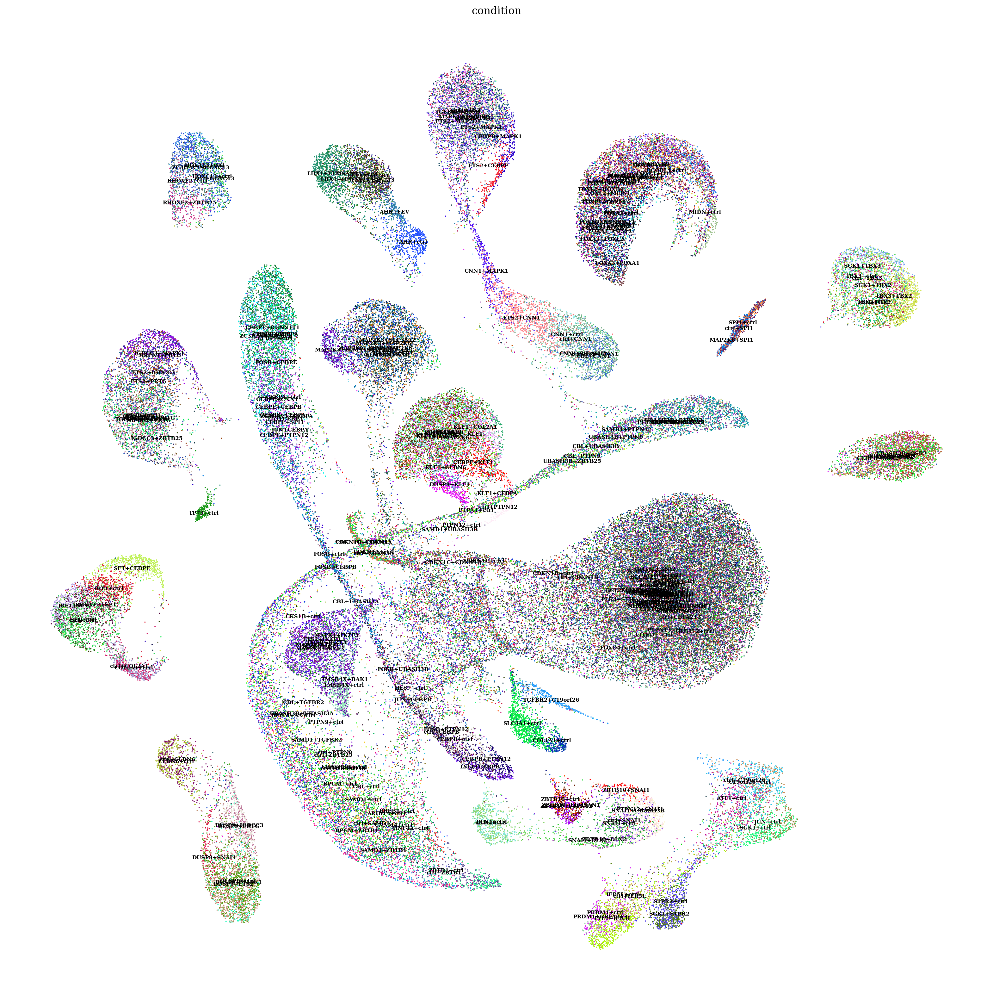

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

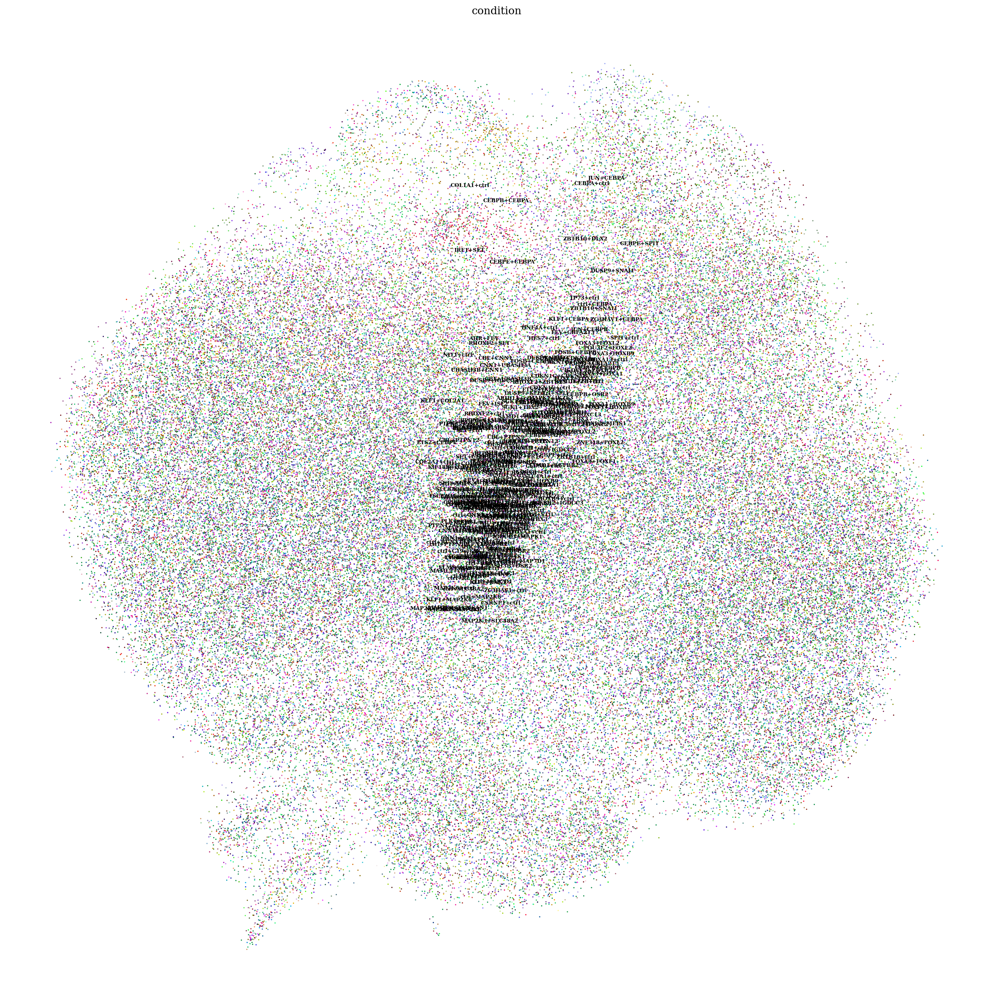

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()